<a href="https://colab.research.google.com/github/pitarac/mvp-sprint-1/blob/main/mvp_sprint_01.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Indentificação:





<p align="center">
  <img src="https://github.com/pitarac/mvp-sprint-1/blob/main/IMG/Sprint.png?raw=true" alt="Imagem com um globo com diversos traços o que passa a ideia de tecnologia, e a escreita Sprint-1, na linha de baixo Análise de dados e boas praticas."/>
</p>



**Nome do aluno:** Paulo Henrique Lima da Silva CPF: 032.838.091-19
**Disciplina:** Sprint I Análise de Dados e Boas Práticas(40530010056_20230_01)  
**Curso:** Ciência de Dados e Analytics  
**Instituição:** PUC-Rio


# Introdução ao Projeto de Análise de Dados



## Apresentação

Olá, Professores! Meu nome é Paulo Henrique, e neste projeto para a disciplina de Análise de Dados e Boas Práticas, busco aplicar os conhecimentos adquiridos durante a SPRINT em uma análise de dados realista.

## Escolha do Dataset

Optei pelo dataset Dados Consumidor.gov.br, que encontrei no repositório Dados.MJ. A escolha se deu pela relevância de explorar o comportamento do consumidor brasileiro e a eficácia do atendimento empresarial ao longo do tempo.

Apesar de ser disponibilizado dados desde 2014, optei nesse notebook por analisar apenas os de 2021 em diante para consegui processar com a memoria ram disponivel na versão gratuita.



## Metodologia

A metodologia envolve:

**Definição do Problema:** Clarificar o objetivo da análise.

**Análise Exploratória:** Entender os dados através de estatísticas descritivas e visualizações.

**Pré-processamento:** Preparar os dados para análise.

**Análise de Dados:** Extrair insights e responder perguntas chave.

## Estrutura do Notebook

O notebook no Google Colab incluirá:

- Descrições detalhadas de cada etapa do processo.
- Código em Python, utilizando bibliotecas apropriadas.
- Comentários e documentação para explicar as decisões tomadas durante a análise.





# Definição do Problema

#Carga de Dados

```
# Isto está formatado como código
```



In [1]:
!pip install geopandas

import paramiko
import os
import pandas as pd
from google.colab import userdata
import glob
import matplotlib.pyplot as plt
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns




# Obtendo credenciais do secret
vps_hostname = userdata.get('host')
vps_username = userdata.get('User')
vps_password = userdata.get('Senha')

Conexão a VPS e gravando de forma local os arquivos.



In [4]:
# Conectando à VPS
vps_client = paramiko.SSHClient()
vps_client.set_missing_host_key_policy(paramiko.AutoAddPolicy())

try:
    vps_client.connect(vps_hostname, username=vps_username, password=vps_password)

    # Abrindo uma sessão SFTP para baixar arquivos
    sftp = vps_client.open_sftp()

    # Caminho da pasta com os arquivos na VPS
    remote_path = '/var/www/dataset.consumidor.gov.br'

    # Caminhos locais onde você deseja salvar os arquivos
    local_shapefiles_path = '/content/shapefiles'
    local_csv_path = '/content/data'

    # Lista de arquivos na pasta remota
    remote_files = sftp.listdir(remote_path)

    for file in remote_files:
        local_file_path = None
        if file.endswith(('.shp', '.shx', '.prj', '.dbf', '.cpg')):
            # Se o arquivo for uma extensão de shapefile, coloque-o na pasta de shapefiles
            local_file_path = os.path.join(local_shapefiles_path, file)
        elif file.endswith('.csv'):
            # Se o arquivo for um CSV, coloque-o na pasta de CSV
            local_file_path = os.path.join(local_csv_path, file)

        if local_file_path:
            # Verifica se o arquivo já existe localmente
            if not os.path.exists(local_file_path):
                # Baixa o arquivo da pasta remota para a pasta local correspondente
                sftp.get(os.path.join(remote_path, file), local_file_path)
                print(f"Arquivo '{file}' baixado com sucesso!")
            else:
                print(f"O arquivo '{file}' já existe localmente. Pulando o download.")

except Exception as e:
    print(f"Ocorreu um erro: {str(e)}")


O arquivo 'finalizadas_2022-05.csv' já existe localmente. Pulando o download.
O arquivo 'finalizadas_2022-07.csv' já existe localmente. Pulando o download.
Arquivo 'BR_UF_2022.prj' baixado com sucesso!
O arquivo 'finalizadas_2022-02.csv' já existe localmente. Pulando o download.
O arquivo 'BR_Pais_2022.shp' já existe localmente. Pulando o download.
O arquivo 'finalizadas_2022-10.csv' já existe localmente. Pulando o download.
O arquivo 'finalizadas_2022-12.csv' já existe localmente. Pulando o download.
O arquivo 'finalizadas_2022-08.csv' já existe localmente. Pulando o download.
O arquivo 'finalizadas_2022-06.csv' já existe localmente. Pulando o download.
O arquivo 'finalizadas_2022-11.csv' já existe localmente. Pulando o download.
Arquivo 'BR_Pais_2022.prj' baixado com sucesso!
O arquivo 'BR_Pais_2022.dbf' já existe localmente. Pulando o download.
O arquivo 'finalizadas_2022-09.csv' já existe localmente. Pulando o download.
O arquivo 'finalizadas_2022-03.csv' já existe localmente. Pula

#  Ler e concatenar vários arquivos CSV





In [5]:


# Caminho onde os arquivos CSV estão salvos no Google Colab
local_path = '/content/data'
all_files = glob.glob(os.path.join(local_path, "*.csv"))

# Lista para armazenar cada DataFrame
dfs = []

# Tentar ler cada arquivo com diferentes delimitadores
for filename in all_files:
    try:
        # Tentando ler com delimitador padrão (',')
        df = pd.read_csv(filename)
        dfs.append(df)
    except pd.errors.ParserError:
        try:
            # Tentando ler com delimitador (';')
            df = pd.read_csv(filename, delimiter=';')
            dfs.append(df)
        except Exception as e:
            print(f"Erro ao ler o arquivo {filename} com delimitadores comuns: {e}")

# Verifica se algum DataFrame foi carregado
if dfs:
    # Concatena todos os DataFrames em um único
    final_df = pd.concat(dfs, ignore_index=True)
    print("DataFrames concatenados com sucesso!")
else:
    print("Nenhum DataFrame foi carregado.")


DataFrames concatenados com sucesso!


In [6]:
# 1. Para mostrar as dimensões (número de linhas e colunas) do DataFrame:
print(final_df.shape)


(2046325, 19)


In [7]:
# 2. Para mostrar informações detalhadas sobre o DataFrame, incluindo o número de entradas não nulas e os tipos de dados de cada coluna:
print(final_df.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2046325 entries, 0 to 2046324
Data columns (total 19 columns):
 #   Column                  Dtype  
---  ------                  -----  
 0   Região                  object 
 1   UF                      object 
 2   Cidade                  object 
 3   Sexo                    object 
 4   Faixa Etária            object 
 5   Data Finalização        object 
 6   Tempo Resposta          float64
 7   Nome Fantasia           object 
 8   Segmento de Mercado     object 
 9   Área                    object 
 10  Assunto                 object 
 11  Grupo Problema          object 
 12  Problema                object 
 13  Como Comprou Contratou  object 
 14  Procurou Empresa        object 
 15  Respondida              object 
 16  Situação                object 
 17  Avaliação Reclamação    object 
 18  Nota do Consumidor      float64
dtypes: float64(2), object(17)
memory usage: 296.6+ MB
None


In [8]:
# Mostra as 10 primeiras linhas do dataset
final_df.head(10)

,Região,UF,Cidade,Sexo,Faixa Etária,Data Finalização,Tempo Resposta,Nome Fantasia,Segmento de Mercado,Área,Assunto,Grupo Problema,Problema,Como Comprou Contratou,Procurou Empresa,Respondida,Situação,Avaliação Reclamação,Nota do Consumidor
0,SE,RJ,Duque de Caxias,M,entre 31 a 40 anos,2023-04-14,NaN,Banco BV (antigo Banco Votorantim),"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Cartão de Crédito / Cartão de Débito / Cartão ...,Cobrança / Contestação,Negativação indevida referente à pagamento já ...,Loja física,N,N,Finalizada não avaliada,Não Avaliada,NaN
1,CO,MS,Ponta Porã,M,entre 41 a 50 anos,2023-04-14,NaN,Banco BV (antigo Banco Votorantim),"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Cartão de Crédito / Cartão de Débito / Cartão ...,Cobrança / Contestação,"Cobrança de tarifas, taxas, valores não previs...",Telefone,S,N,Finalizada não avaliada,Não Avaliada,NaN
2,S,SC,Chapecó,M,entre 31 a 40 anos,2023-04-14,NaN,Banco BV (antigo Banco Votorantim),"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Financiamentos de Veículos / Leasing,Cobrança / Contestação,Cobrança por serviço/produto não contratado / ...,Loja física,S,N,Finalizada não avaliada,Não Avaliada,NaN
3,SE,SP,Santa Rosa de Viterbo,F,entre 41 a 50 anos,2023-04-14,NaN,Banco BV (antigo Banco Votorantim),"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Financiamentos de Veículos / Leasing,Atendimento / SAC,SAC - Demanda não resolvida / não respondida /...,Loja física,S,N,Finalizada não avaliada,Não Avaliada,NaN
4,SE,SP,Salto de Pirapora,F,entre 61 a 70 anos,2023-04-14,NaN,Banco BV (antigo Banco Votorantim),"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Crédito Consignado / Cartão de Crédito Consign...,Contrato / Oferta,Não entrega do contrato ou documentação relaci...,Loja física,S,N,Finalizada não avaliada,Não Avaliada,NaN
5,NE,SE,Aracaju,M,entre 51 a 60 anos,2023-04-01,NaN,Magazine Luiza - Loja Online,Comércio Eletrônico,Serviços Financeiros,Seguro Desemprego / Perda de renda,Atendimento / SAC,Dificuldade de contato / acesso a outros canai...,Internet,S,N,Finalizada não avaliada,Não Avaliada,NaN
6,SE,RJ,Rio de Janeiro,M,entre 41 a 50 anos,2023-04-01,NaN,Cartão de Todos,Cartões de Descontos,Saúde,"Serviços particulares de saúde ( médico, odont...",Cobrança / Contestação,Cobrança indevida / abusiva para alterar ou ca...,Internet,S,N,Finalizada não avaliada,Não Avaliada,NaN
7,SE,RJ,Rio de Janeiro,M,entre 21 a 30 anos,2023-04-01,NaN,Financeira BRB,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Crédito Consignado / Cartão de Crédito Consign...,Cobrança / Contestação,Cobrança indevida / abusiva para alterar ou ca...,Internet,N,N,Finalizada não avaliada,Não Avaliada,NaN
8,CO,DF,Brasília,F,entre 41 a 50 anos,2023-04-01,NaN,BRB - Banco de Brasília,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Conta corrente / Salário / Poupança /Conta Apo...,Cobrança / Contestação,Cobrança indevida / abusiva para alterar ou ca...,Não comprei / contratei,S,N,Finalizada não avaliada,Não Avaliada,NaN
9,CO,DF,Brasília,F,entre 51 a 60 anos,2023-04-01,NaN,BRB - Banco de Brasília,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Seguro Prestamista,Cobrança / Contestação,Dificuldade / atraso na devolução de valores p...,Não comprei / contratei,S,N,Finalizada não avaliada,Não Avaliada,NaN


In [9]:
# Mostra as 10 últimas linhas do dataset
final_df.tail(10)

,Região,UF,Cidade,Sexo,Faixa Etária,Data Finalização,Tempo Resposta,Nome Fantasia,Segmento de Mercado,Área,Assunto,Grupo Problema,Problema,Como Comprou Contratou,Procurou Empresa,Respondida,Situação,Avaliação Reclamação,Nota do Consumidor
2046315,NE,BA,Salvador,F,entre 41 a 50 anos,2022-05-31,0.0,Neoenergia Coelba,Energia Elétrica,"Água, Energia, Gás",Energia Elétrica,Cobrança / Contestação,Cobrança por serviços não realizados / atrasad...,Loja física,S,S,Finalizada avaliada,Resolvida,5.0
2046316,SE,ES,Guarapari,F,entre 21 a 30 anos,2022-05-31,0.0,Sem Parar,Empresas de Pagamento Eletrônico,Serviços Financeiros,Serviço de pagamento online/ via celular/ maqu...,Cobrança / Contestação,Cobrança por serviço/produto não contratado / ...,Não comprei / contratei,S,S,Finalizada avaliada,Resolvida,1.0
2046317,SE,SP,Bragança Paulista,F,entre 31 a 40 anos,2022-05-31,0.0,Flytour Viagens,"Viagens, Turismo e Hospedagem",Turismo/Viagens,Pacote / excursão / agência de turismo,Cobrança / Contestação,Dificuldade / atraso na devolução de valores p...,Não comprei / contratei,S,S,Finalizada avaliada,Resolvida,3.0
2046318,SE,SP,São Paulo,F,entre 21 a 30 anos,2022-05-31,0.0,Mercado Livre,Empresas de Intermediação de Serviços / Negócios,Demais Produtos,Utilidades Domésticas e Decoração (para limpez...,Entrega do Produto,Não entrega / demora na entrega do produto,Internet,S,S,Finalizada avaliada,Resolvida,5.0
2046319,NE,MA,Carutapera,M,entre 21 a 30 anos,2022-05-31,0.0,Mercado Livre,Empresas de Intermediação de Serviços / Negócios,Demais Produtos,"Veículos ? Peças e Acessórios (roda, pneu, rád...",Entrega do Produto,Não entrega / demora na entrega do produto,Internet,S,S,Finalizada avaliada,Resolvida,4.0
2046320,SE,SP,São Paulo,M,entre 31 a 40 anos,2022-05-31,0.0,Mercado Pago,Empresas de Pagamento Eletrônico,Demais Serviços,"Serviços na internet (provedor, hospedagem, ap...",Atendimento / SAC,Má qualidade no atendimento (descortesia / des...,Internet,S,S,Finalizada avaliada,Não Resolvida,1.0
2046321,SE,SP,São Paulo,F,entre 31 a 40 anos,2022-05-31,0.0,Banco Cetelem,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Cartão de Crédito / Cartão de Débito / Cartão ...,Informação,Informações incompletas / inadequadas sobre o ...,Loja física,S,S,Finalizada avaliada,Resolvida,2.0
2046322,SE,SP,São Paulo,M,entre 21 a 30 anos,2022-05-31,0.0,Banco Original,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Atendimento Bancário,Atendimento / SAC,Má qualidade no atendimento presencial ou outr...,Internet,S,S,Finalizada avaliada,Resolvida,5.0
2046323,SE,SP,São Paulo,M,entre 21 a 30 anos,2022-05-31,0.0,Banco Original,"Bancos, Financeiras e Administradoras de Cartão",Demais Serviços,"Programas de Fidelidade / Benefícios (pontos, ...",Cobrança / Contestação,Cobrança indevida / abusiva para alterar ou ca...,Loja física,S,S,Finalizada avaliada,Resolvida,5.0
2046324,CO,GO,Itumbiara,M,entre 31 a 40 anos,2022-05-31,0.0,Flytour Viagens,"Viagens, Turismo e Hospedagem",Turismo/Viagens,Pacote / excursão / agência de turismo,Contrato / Oferta,Dificuldade para alterar ou cancelar o contrat...,Loja física,S,S,Finalizada avaliada,Não Resolvida,1.0


In [10]:
# Faz um resumo estatístico do dataset (média, desvio padrão, mínimo, máximo e os quartis)
print(final_df.describe())


       Tempo Resposta  Nota do Consumidor
count    2.007793e+06        1.024623e+06
mean     6.525656e+00        2.858503e+00
std      3.064824e+00        1.790878e+00
min      0.000000e+00        1.000000e+00
25%      4.000000e+00        1.000000e+00
50%      7.000000e+00        3.000000e+00
75%      9.000000e+00        5.000000e+00
max      1.600000e+01        5.000000e+00


In [11]:
colunas_categoricas = [
    'Região', 'UF', 'Cidade', 'Sexo', 'Faixa Etária', 'Nome Fantasia',
    'Segmento de Mercado', 'Área', 'Assunto', 'Grupo Problema', 'Problema',
    'Como Comprou Contratou', 'Procurou Empresa', 'Respondida', 'Situação',
    'Avaliação Reclamação'
]

# Iterando sobre cada coluna categórica e exibindo a distribuição de classes
for coluna in colunas_categoricas:
    print(f"Distribuição de classes na coluna '{coluna}':")
    print(final_df[coluna].value_counts())
    print("\n")  # Adiciona uma linha em branco entre as saídas para melhor legibilidade


Distribuição de classes na coluna 'Região':
SE    993803
S     381968
NE    363110
CO    221870
N      85574
Name: Região, dtype: int64


Distribuição de classes na coluna 'UF':
SP    511237
MG    232080
RJ    203060
PR    179289
BA    117685
RS    109786
DF     98411
SC     92893
GO     66830
CE     59765
PE     51169
ES     47426
MA     36676
MT     35757
PA     30127
PI     26594
PB     24227
AM     21192
MS     20872
RN     19683
AL     14296
SE     13015
TO     12939
RO      8832
AC      5539
RR      3652
AP      3293
Name: UF, dtype: int64


Distribuição de classes na coluna 'Cidade':
São Paulo         203405
Rio de Janeiro    113596
Brasília           98411
Curitiba           78747
Belo Horizonte     70551
                   ...  
Biritiba-Ussu          1
Passagem               1
Monjolos               1
Guarizinho             1
Ponte Preta            1
Name: Cidade, Length: 6246, dtype: int64


Distribuição de classes na coluna 'Sexo':
M    1200291
F     844755
O       1124
Nam




# Visualizações Unimodais



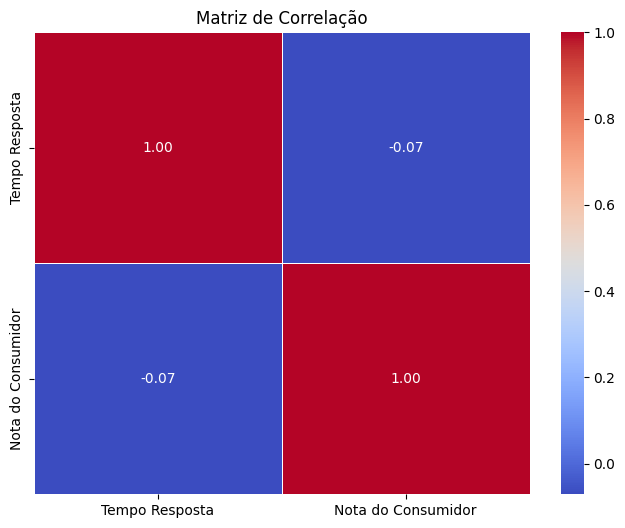

In [33]:
# Selecionando as colunas numéricas relevantes para a matriz de correlação
cols_numericas = ['Tempo Resposta', 'Nota do Consumidor']

# Criando a matriz de correlação
correlation_matrix = final_df[cols_numericas].corr()

# Plotando a matriz de correlação com Seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Matriz de Correlação')
plt.show()

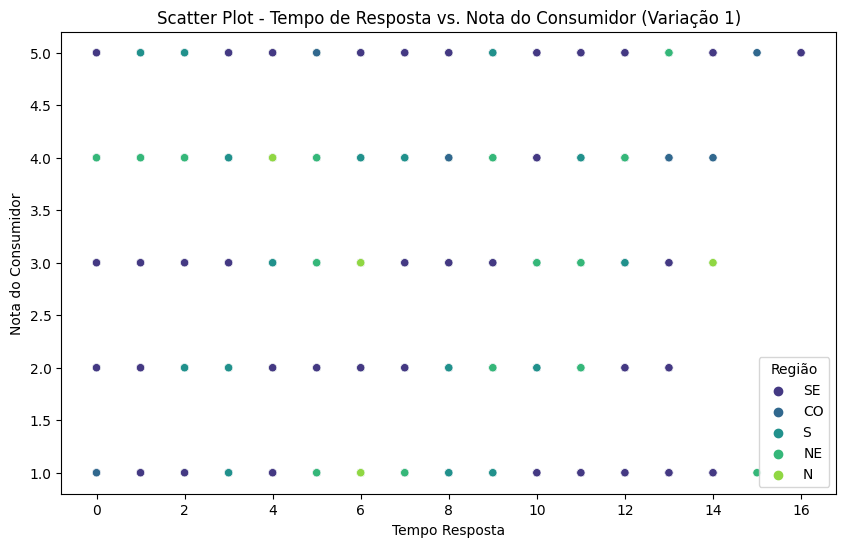

In [34]:
# Scatter Plot com Seaborn - Variação 1
plt.figure(figsize=(10, 6))
sns.scatterplot(data=final_df, x='Tempo Resposta', y='Nota do Consumidor', hue='Região', palette='viridis')
plt.title('Scatter Plot - Tempo de Resposta vs. Nota do Consumidor (Variação 1)')
plt.show()

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


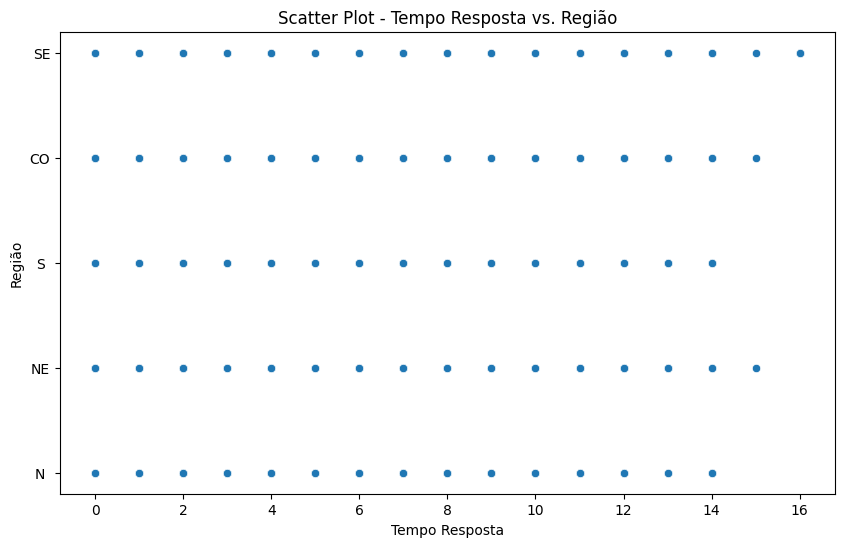

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


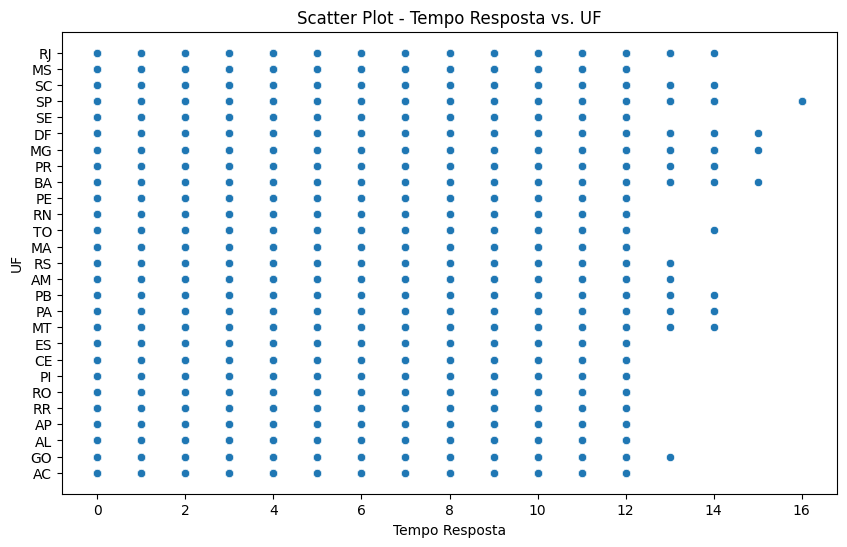

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


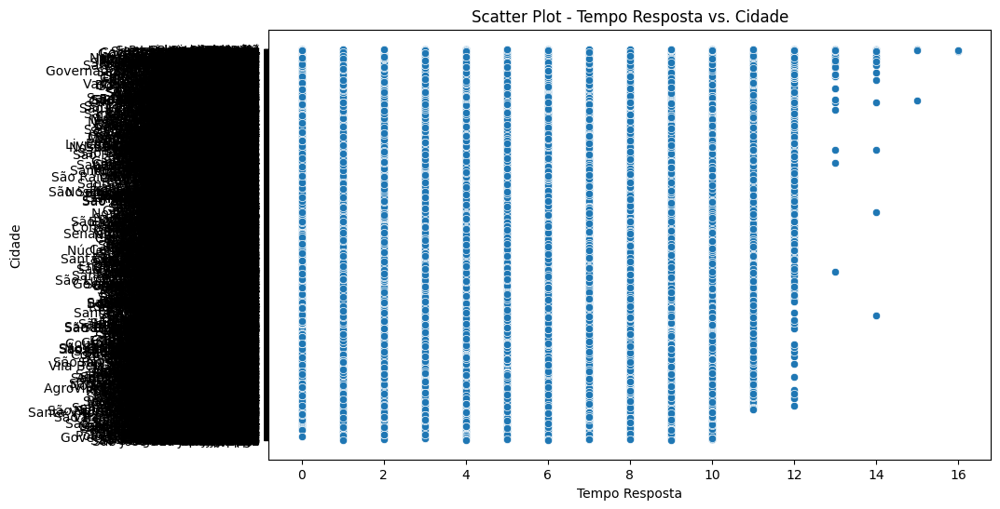

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


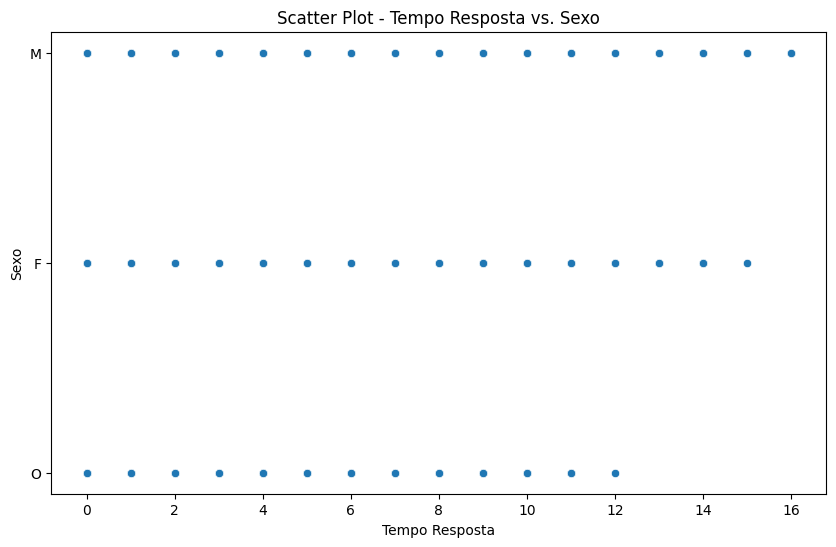

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


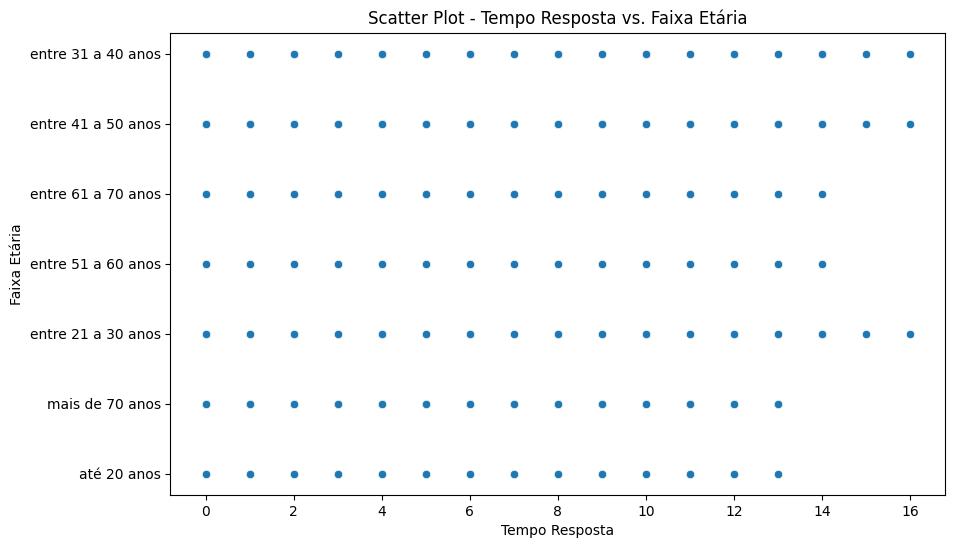

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


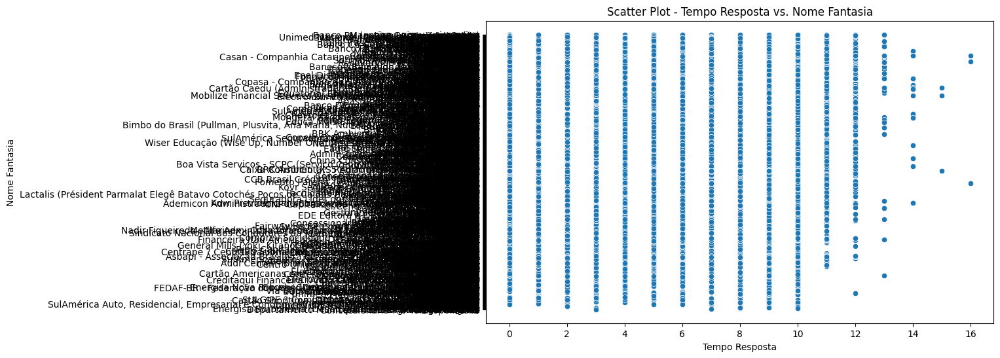

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


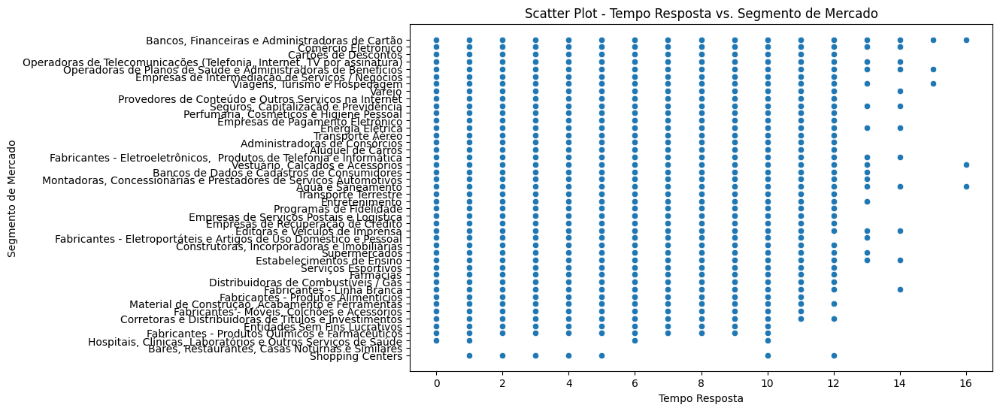

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


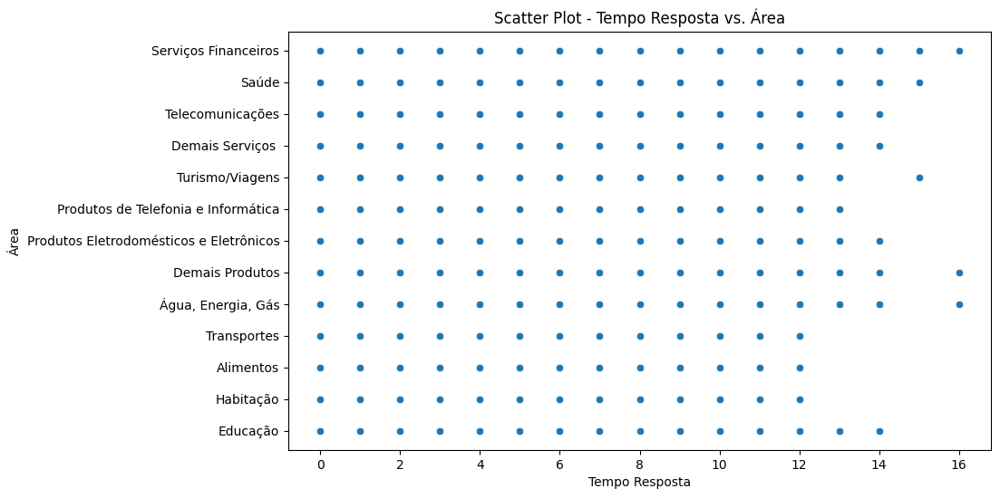

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


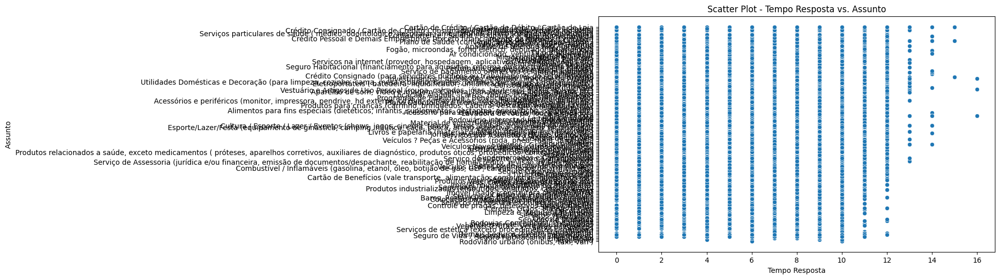

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


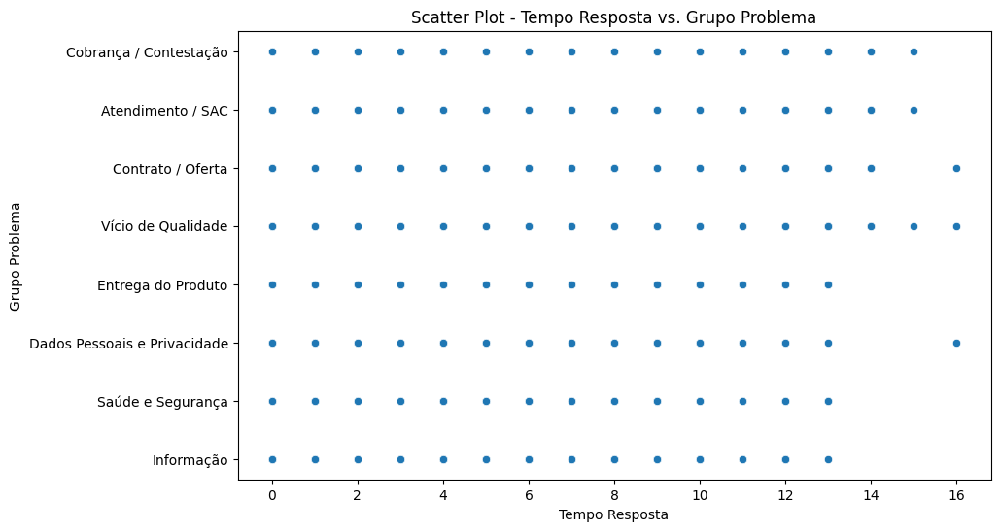

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


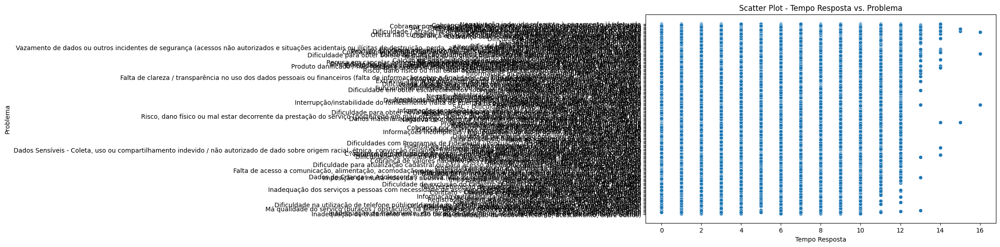

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


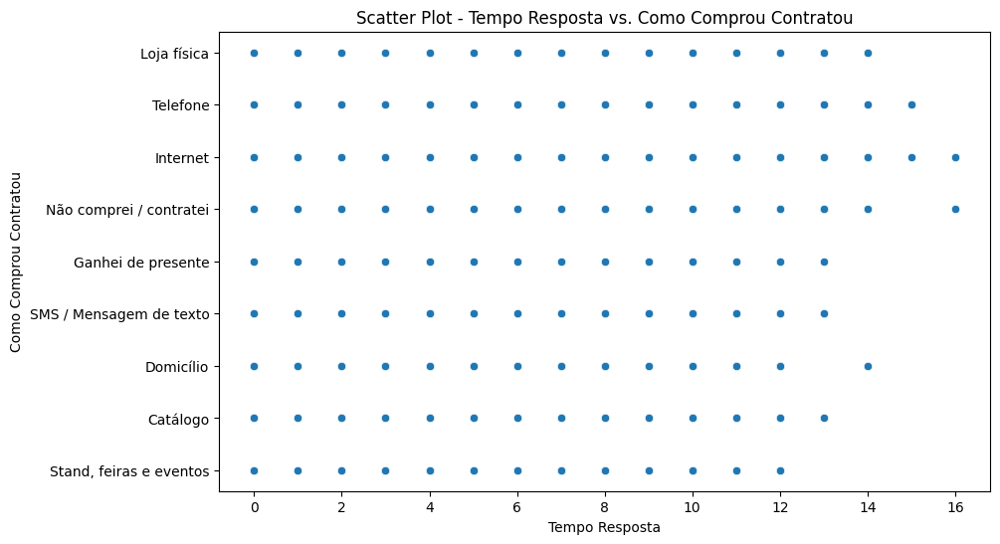

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


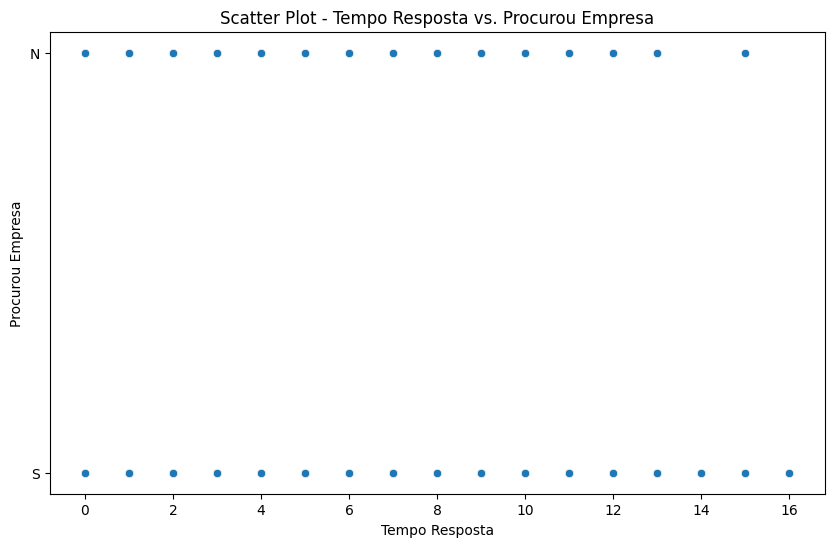

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


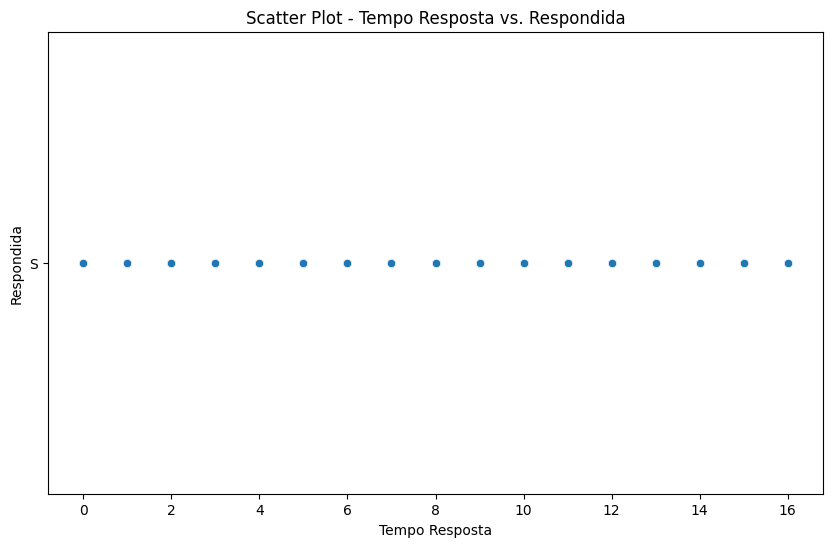

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


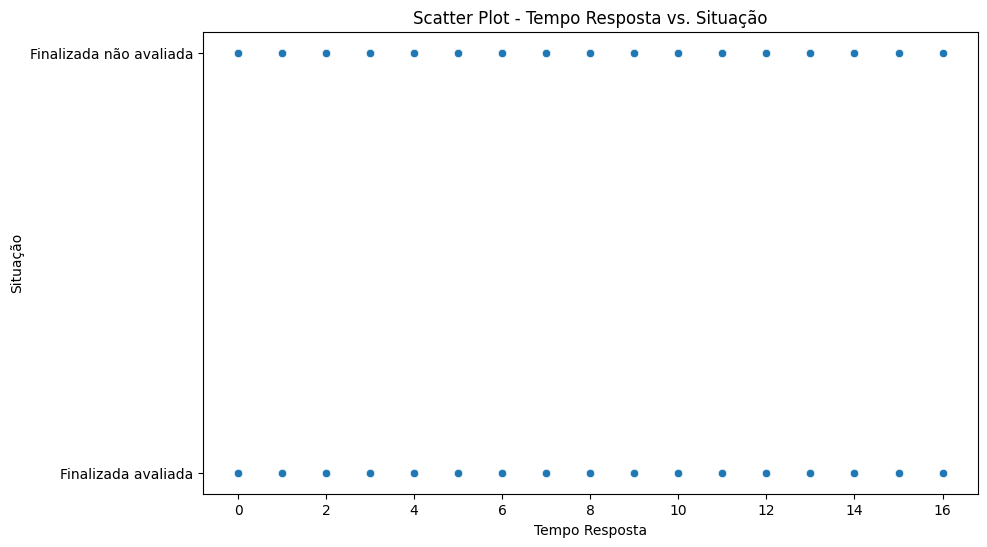

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


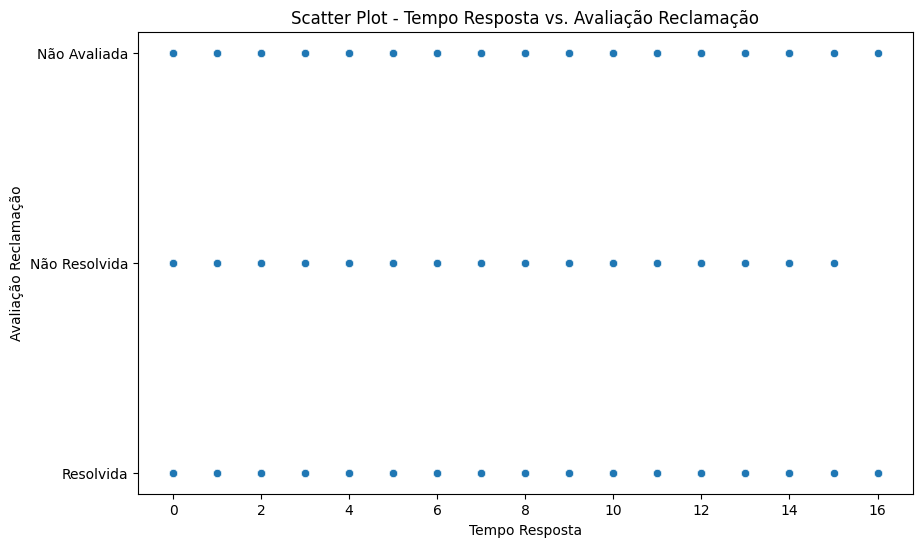

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


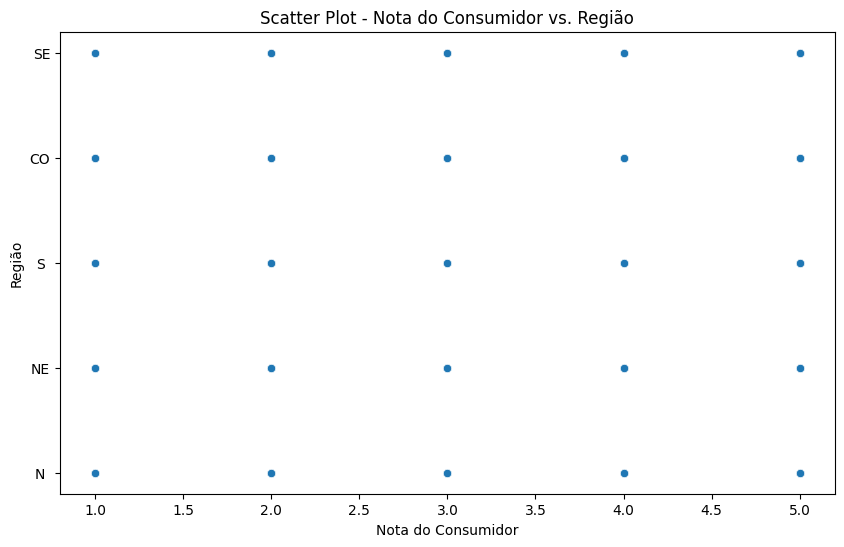

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


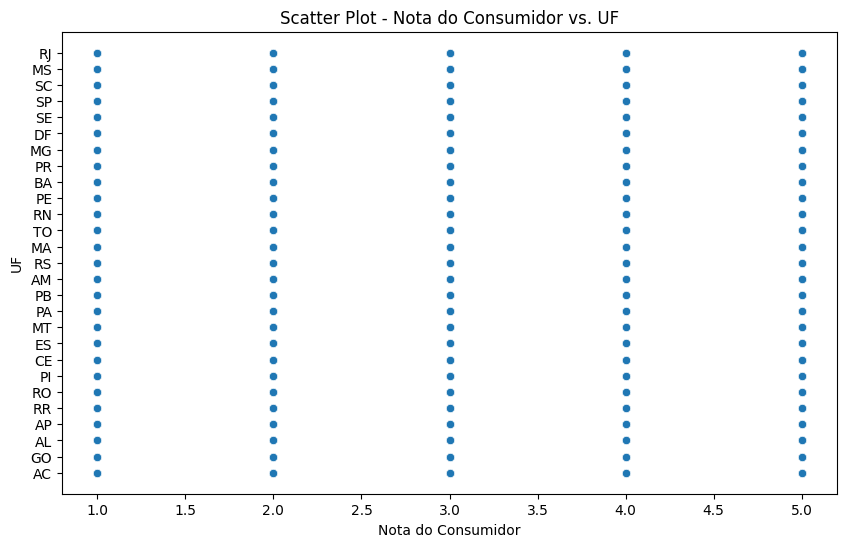

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


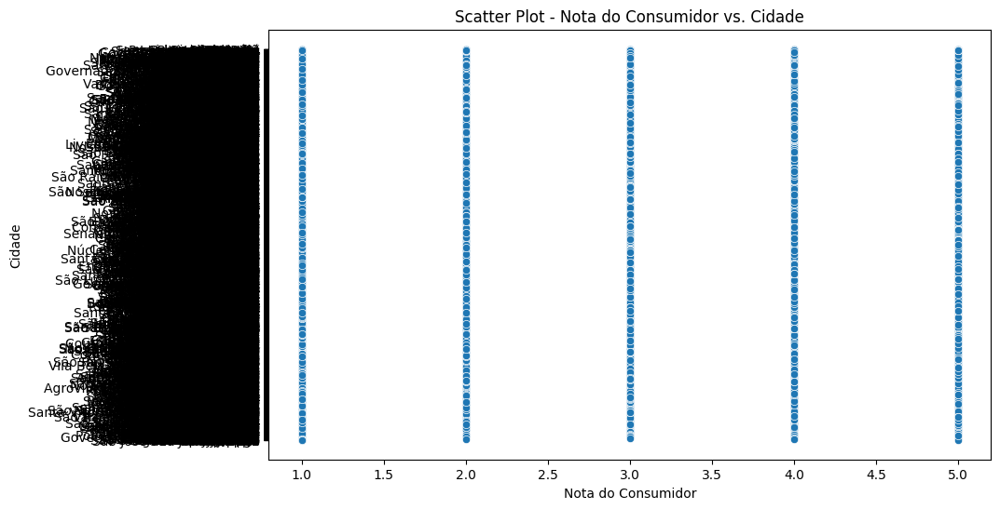

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


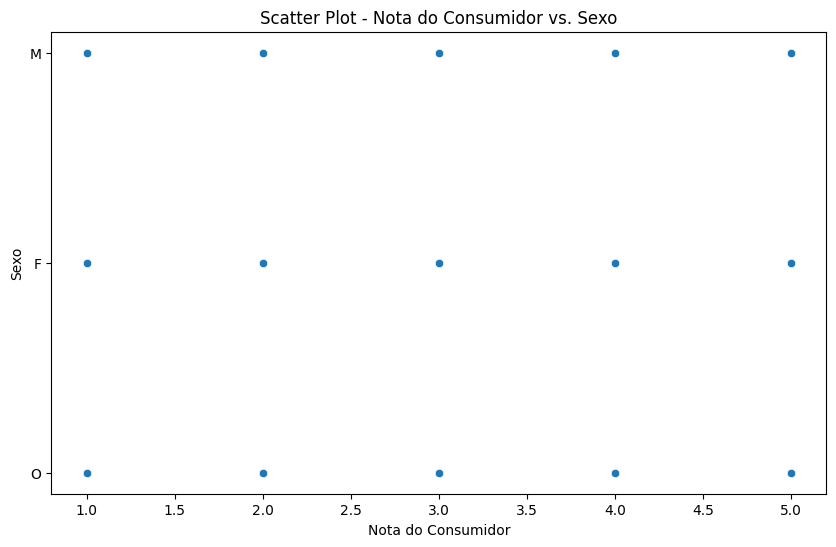

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


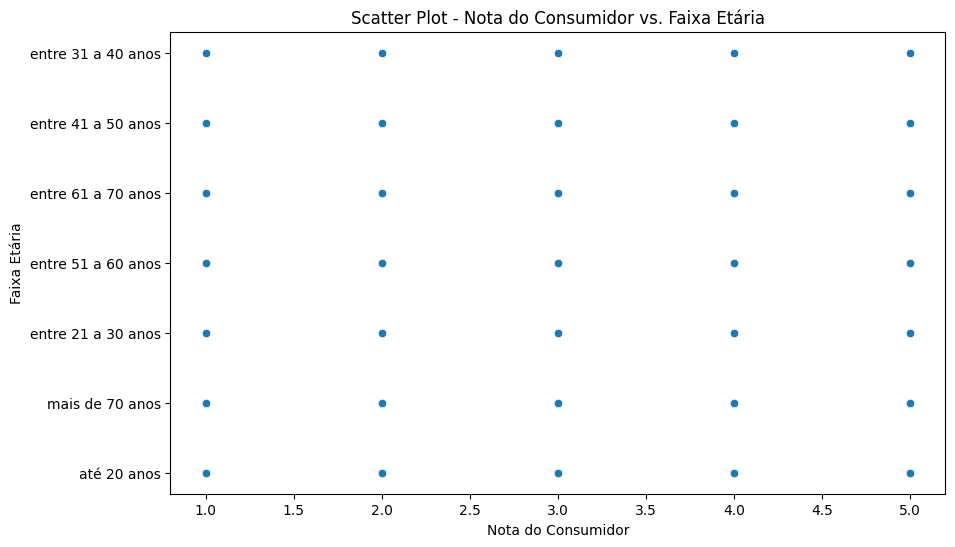

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


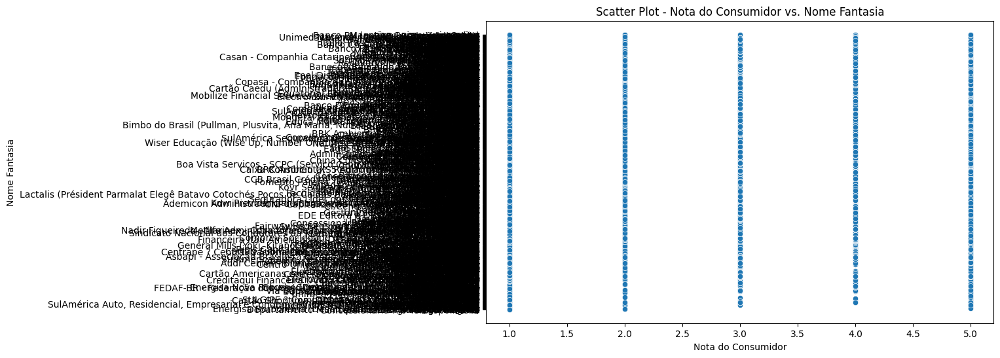

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


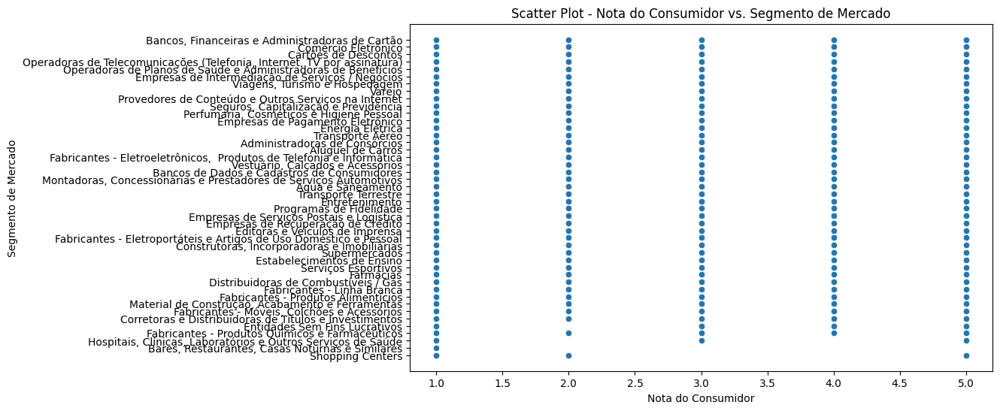

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


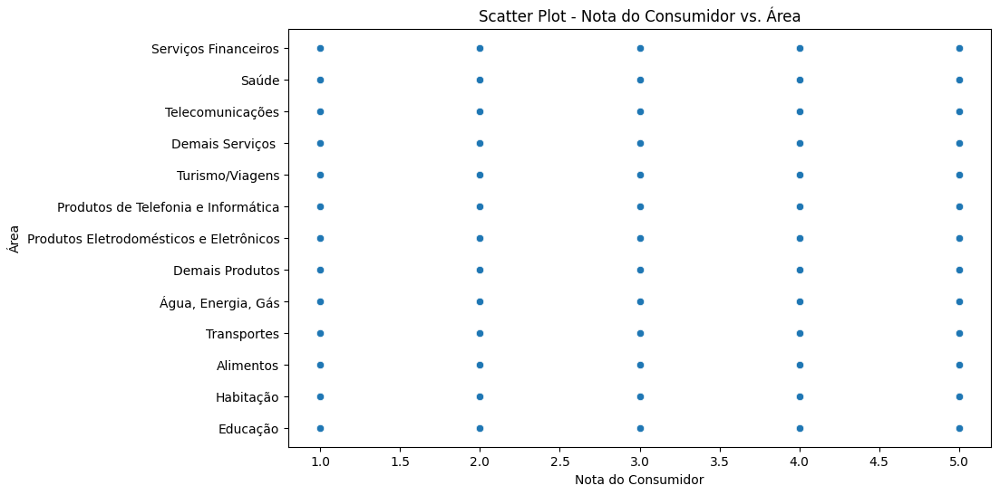

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


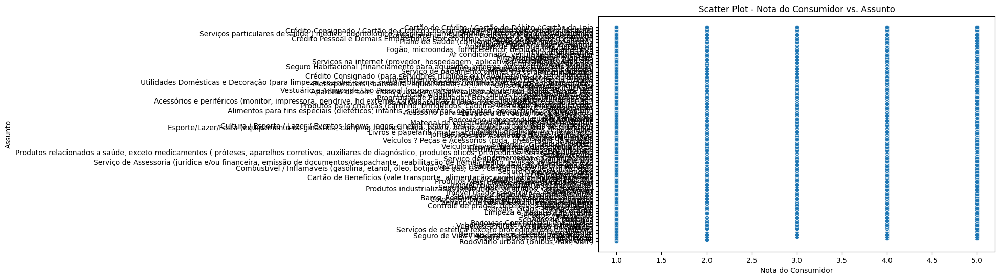

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


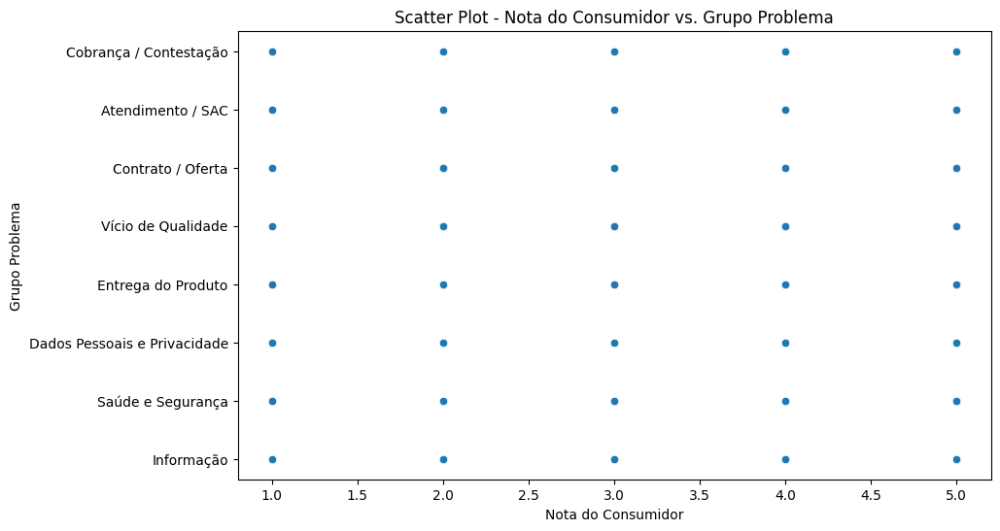

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


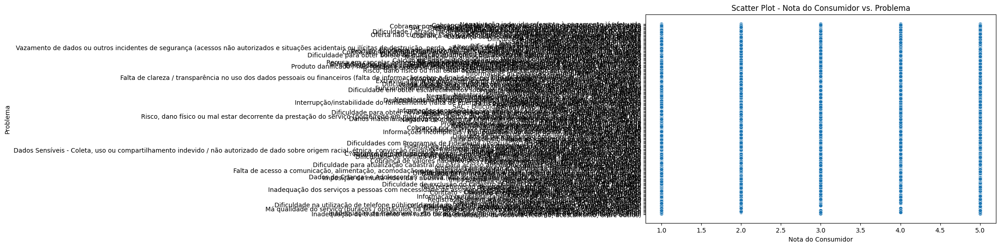

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


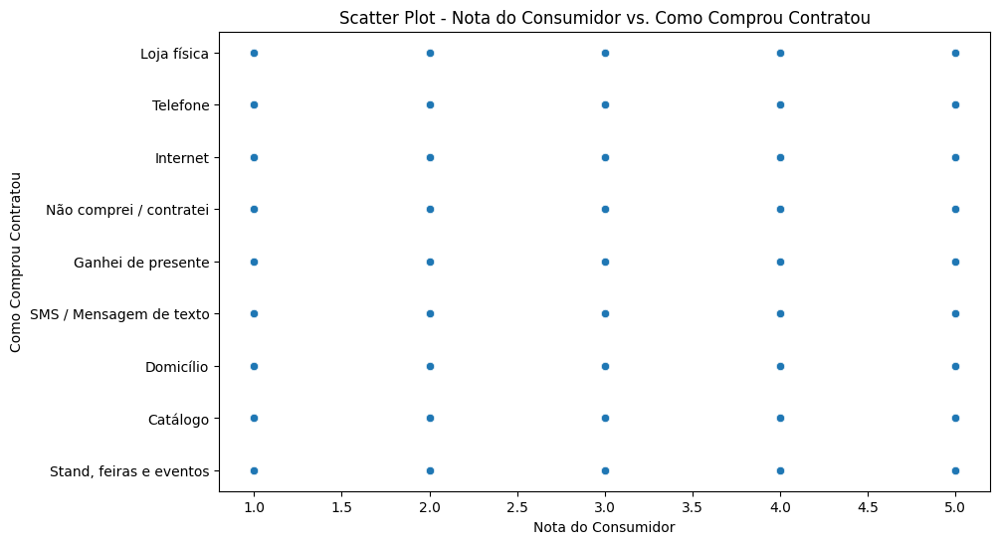

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


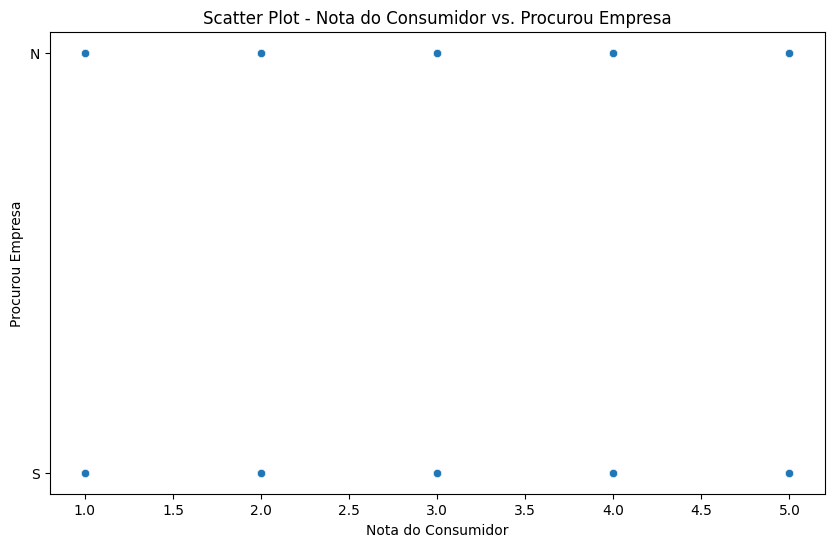

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


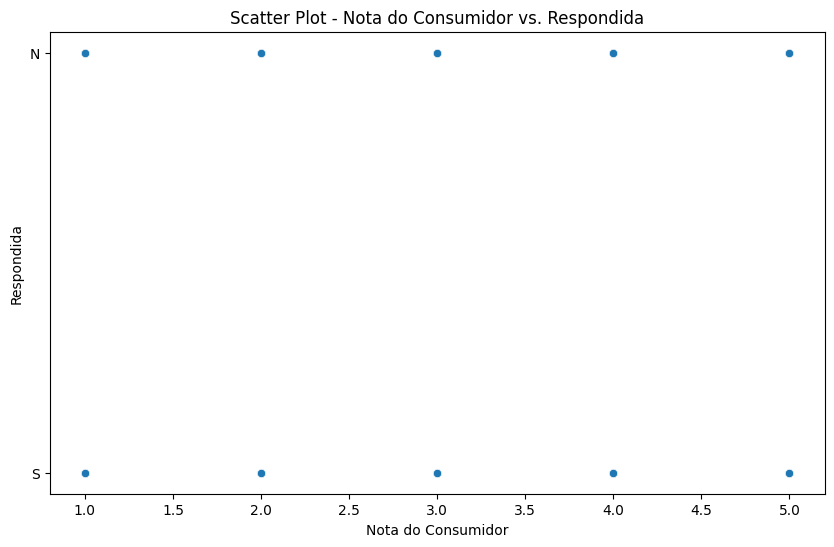

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


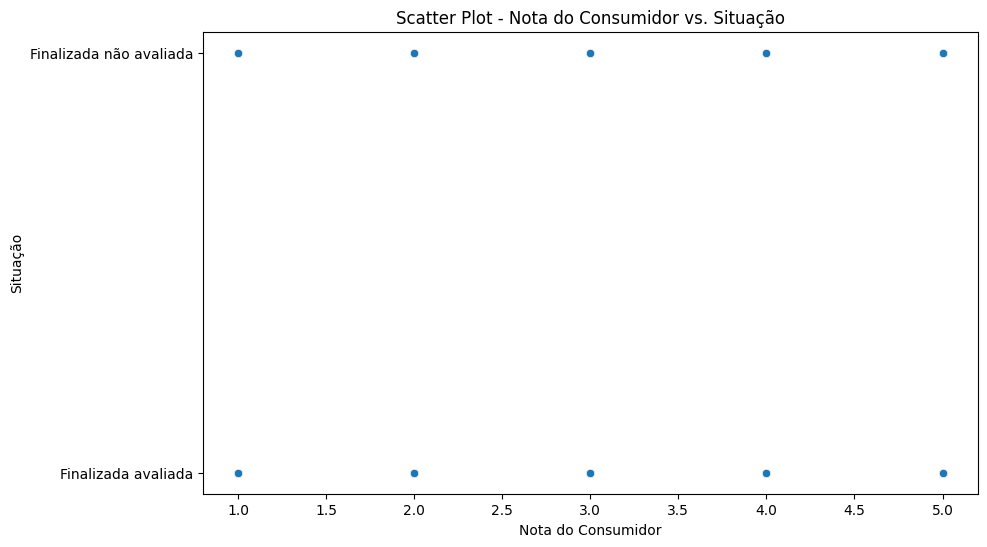

<ipython-input-36-d69a9b8d812e>:18: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')


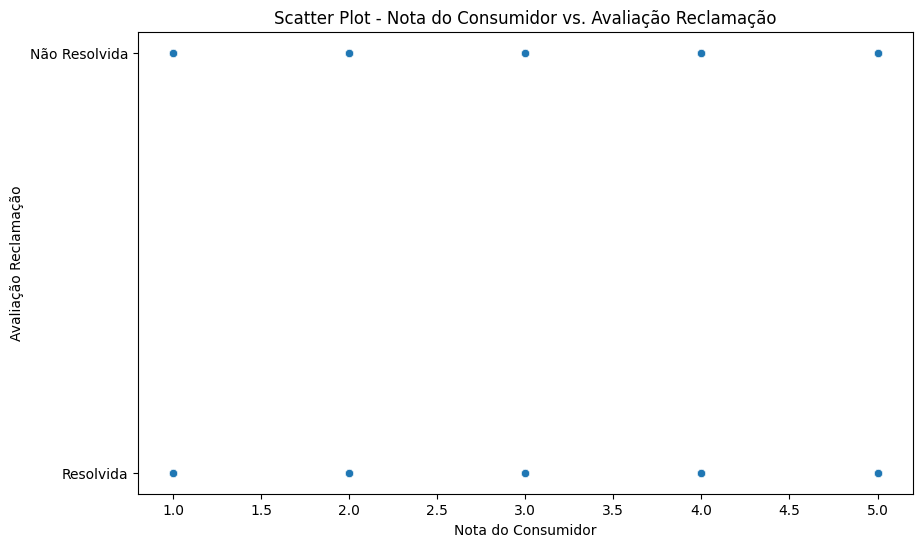

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

# Lista de colunas numéricas
numeric_columns = ['Tempo Resposta', 'Nota do Consumidor']

# Lista de colunas categóricas (classes)
categorical_columns = ['Região', 'UF', 'Cidade', 'Sexo', 'Faixa Etária', 'Nome Fantasia',
                       'Segmento de Mercado', 'Área', 'Assunto', 'Grupo Problema',
                       'Problema', 'Como Comprou Contratou', 'Procurou Empresa',
                       'Respondida', 'Situação', 'Avaliação Reclamação']

# Loop para criar gráficos de dispersão para cada combinação de coluna numérica e categórica
for num_col in numeric_columns:
    for cat_col in categorical_columns:
        if num_col != cat_col:  # Evita criar gráficos de dispersão da mesma coluna
            plt.figure(figsize=(10, 6))
            sns.scatterplot(data=final_df, x=num_col, y=cat_col, palette='viridis')
            plt.title(f'Scatter Plot - {num_col} vs. {cat_col}')
            plt.show()


/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


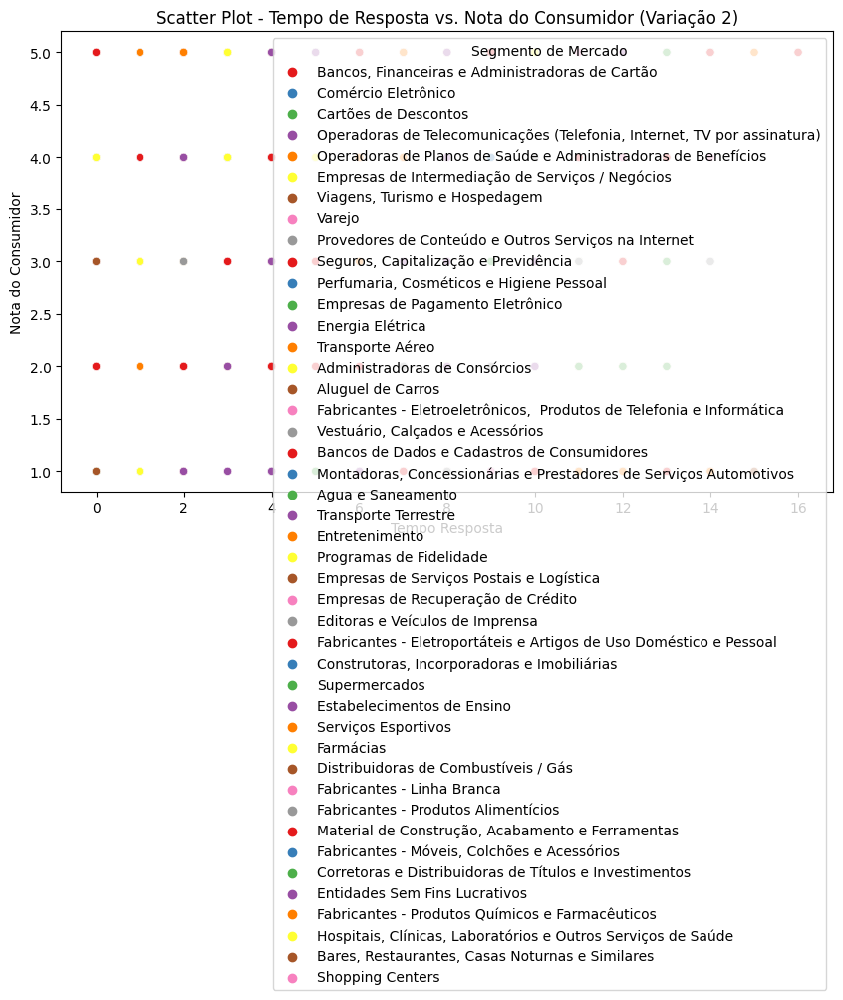

In [35]:
# Scatter Plot com Seaborn - Variação 2
plt.figure(figsize=(10, 6))
sns.scatterplot(data=final_df, x='Tempo Resposta', y='Nota do Consumidor', hue='Segmento de Mercado', palette='Set1')
plt.title('Scatter Plot - Tempo de Resposta vs. Nota do Consumidor (Variação 2)')
plt.show()

# Análise dos dados

**Análise Regional e Estadual:**



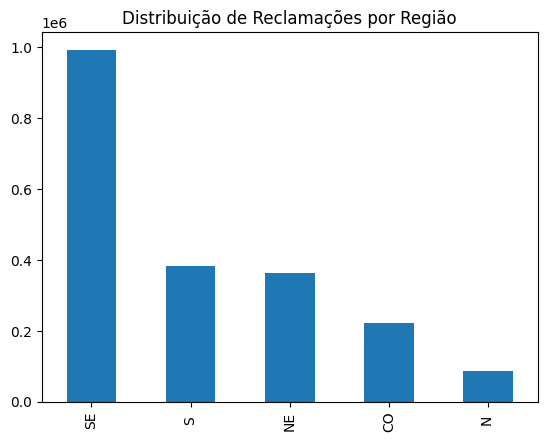

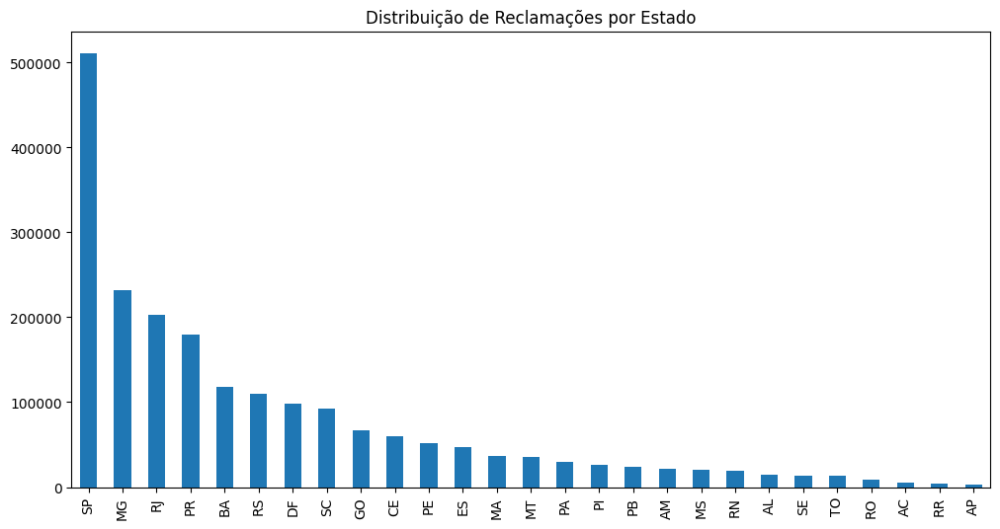

In [19]:
# Análise por região
final_df['Região'].value_counts().plot(kind='bar')
plt.title('Distribuição de Reclamações por Região')
plt.show()

# Análise por estado
final_df['UF'].value_counts().plot(kind='bar', figsize=(12, 6))
plt.title('Distribuição de Reclamações por Estado')
plt.show()

**Perfil do Consumidor:**

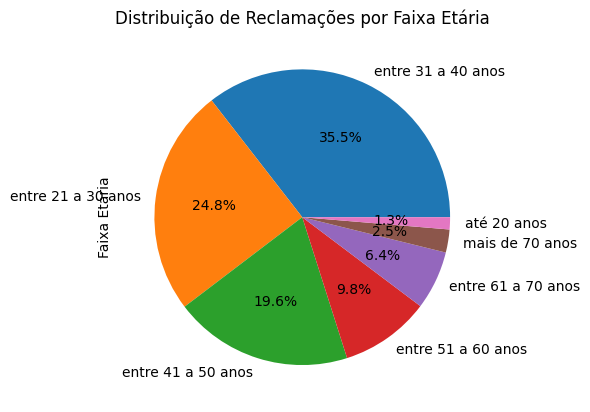

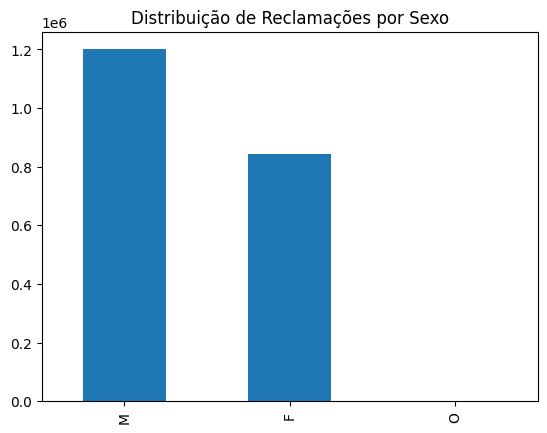

In [20]:
# Análise por faixa etária
final_df['Faixa Etária'].value_counts().plot(kind='pie', autopct='%1.1f%%')
plt.title('Distribuição de Reclamações por Faixa Etária')
plt.show()

# Análise por sexo
final_df['Sexo'].value_counts().plot(kind='bar')
plt.title('Distribuição de Reclamações por Sexo')
plt.show()


**Segmento de Mercado e Problemas Relacionados:**

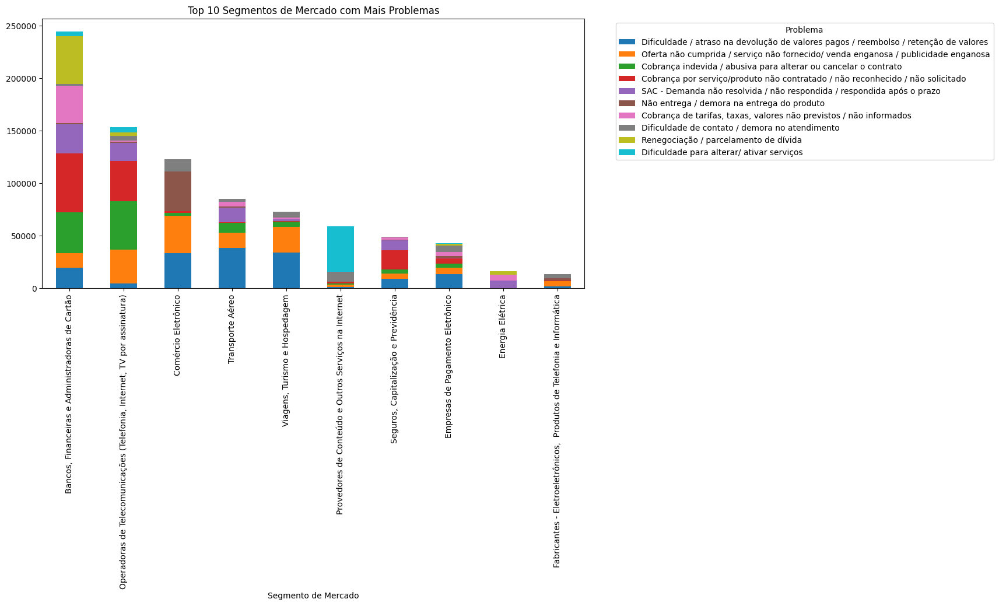

In [32]:
# Agrupando problemas por segmento de mercado
segmento_problemas = final_df.groupby('Segmento de Mercado')['Problema'].value_counts().unstack().fillna(0)

# Selecionando os 10 segmentos de mercado com mais problemas
top_10_segmentos = segmento_problemas.sum(axis=1).nlargest(10).index

# Selecionando os 10 problemas mais comuns
top_10_problemas = segmento_problemas.sum().nlargest(10).index

# Filtrando o DataFrame para incluir apenas os 10 segmentos e 10 problemas
segmento_problemas = segmento_problemas.loc[top_10_segmentos, top_10_problemas]

# Plotando o gráfico de barras empilhadas
segmento_problemas.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Top 10 Segmentos de Mercado com Mais Problemas')
plt.legend(title='Problema', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


**Cidades com Maior Número de Reclamações:**

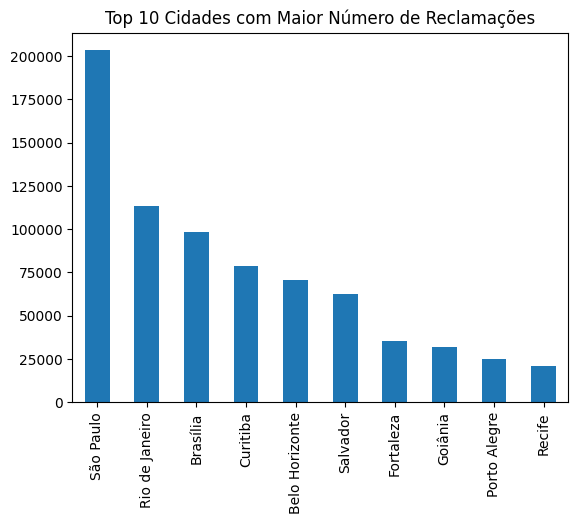

In [22]:
final_df['Cidade'].value_counts().head(10).plot(kind='bar')
plt.title('Top 10 Cidades com Maior Número de Reclamações')
plt.show()


Métodos de Compra e Reclamação:

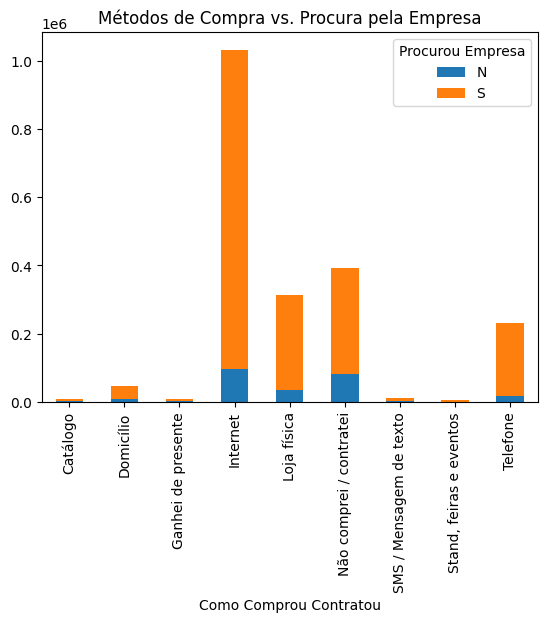

In [23]:
compra_reclamacao = final_df.groupby('Como Comprou Contratou')['Procurou Empresa'].value_counts().unstack().fillna(0)
compra_reclamacao.plot(kind='bar', stacked=True)
plt.title('Métodos de Compra vs. Procura pela Empresa')
plt.show()


**Satisfação do Consumidor:**

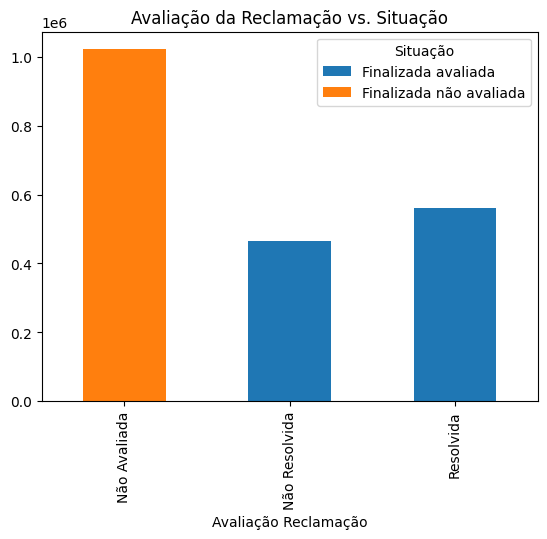

In [28]:
avaliacao_situacao = final_df.groupby('Avaliação Reclamação')['Situação'].value_counts().unstack().fillna(0)
avaliacao_situacao.plot(kind='bar', stacked=True)
plt.title('Avaliação da Reclamação vs. Situação')
plt.show()


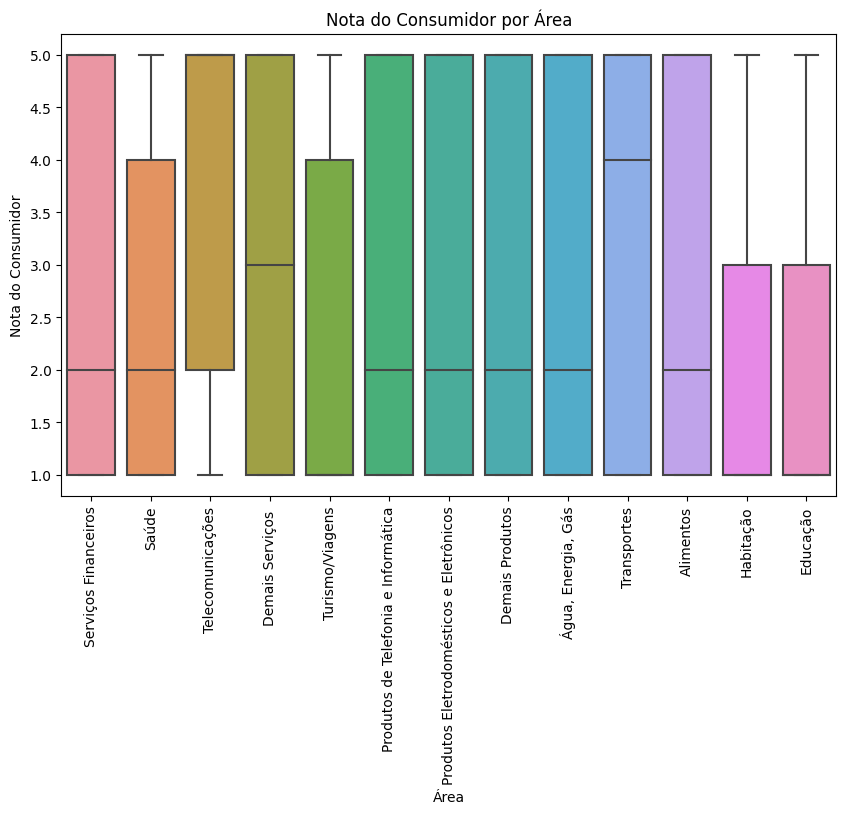

In [38]:

# Carregar o shapefile dos estados do Brasil
brasil_estados = gpd.read_file('/content/shapefiles/BR_UF_2022.shp')


# Gráfico 4: Nota do Consumidor por Área
plt.figure(figsize=(10, 6))
sns.boxplot(x='Área', y='Nota do Consumidor', data=final_df)
plt.xticks(rotation=90)
plt.title('Nota do Consumidor por Área')
plt.show()


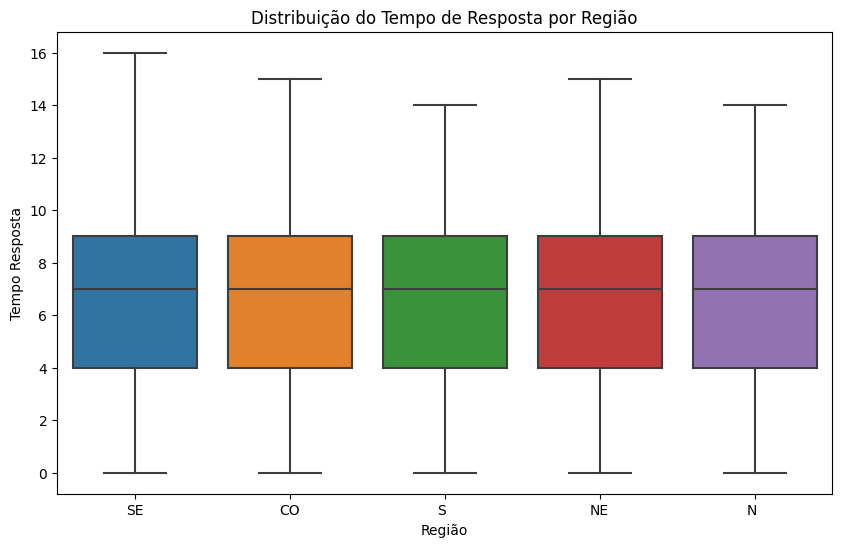

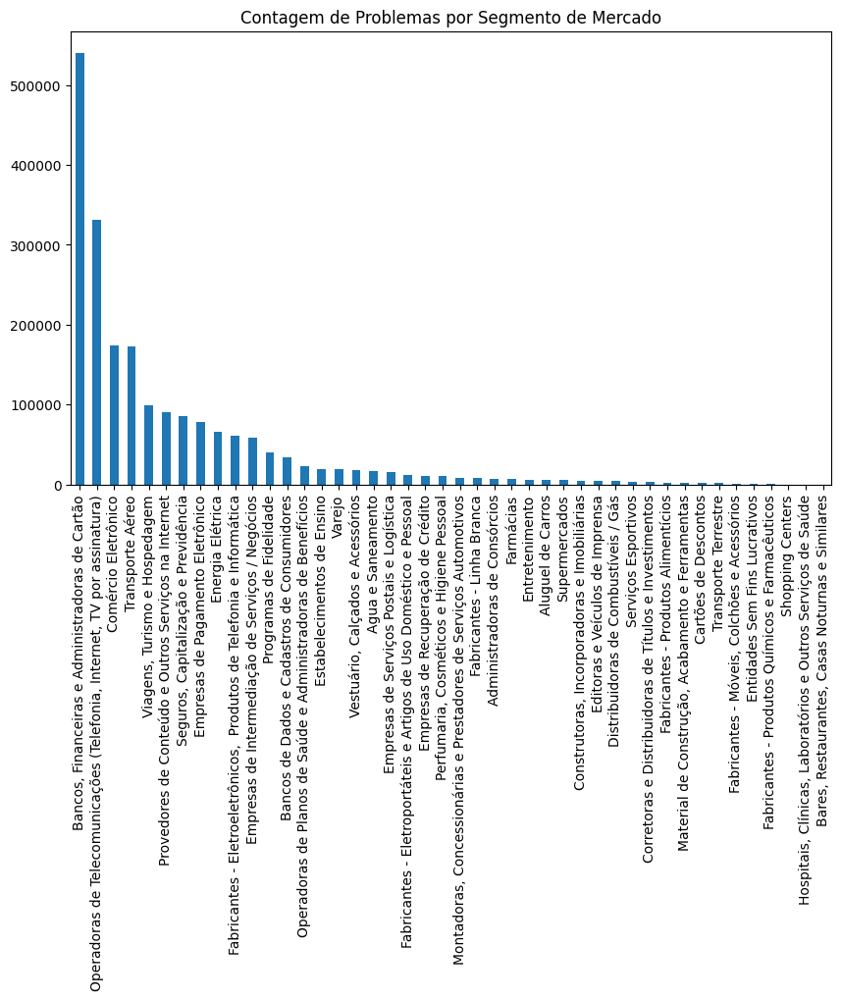

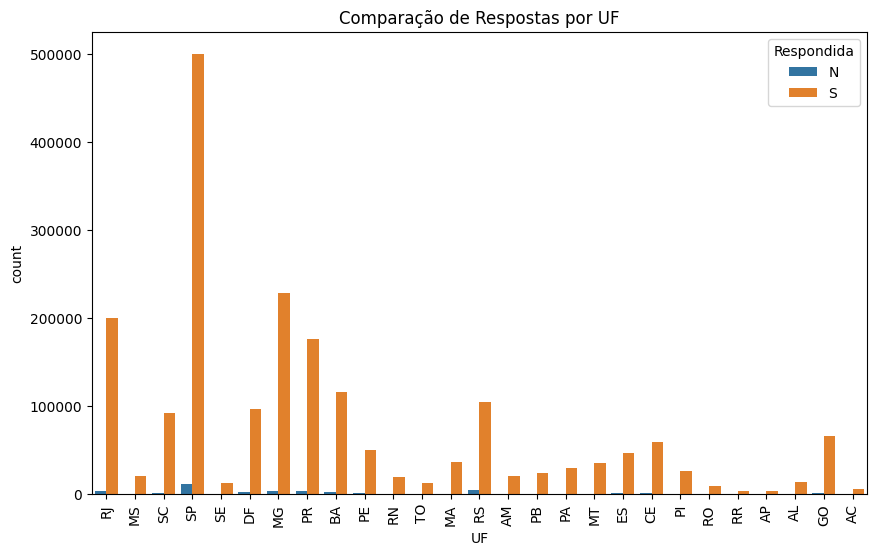

In [16]:


# Gráfico 1: Distribuição do 'Tempo Resposta' por 'Região'
plt.figure(figsize=(10, 6))
sns.boxplot(x='Região', y='Tempo Resposta', data=final_df)
plt.title('Distribuição do Tempo de Resposta por Região')
plt.show()

# Gráfico 2: Contagem de 'Problemas' por 'Segmento de Mercado'
plt.figure(figsize=(10, 6))
final_df['Segmento de Mercado'].value_counts().plot(kind='bar')
plt.title('Contagem de Problemas por Segmento de Mercado')
plt.xticks(rotation=90)
plt.show()



# Gráfico 3: Comparação de 'Respostas' por 'UF'
plt.figure(figsize=(10, 6))
sns.countplot(x='UF', hue='Respondida', data=final_df)
plt.title('Comparação de Respostas por UF')
plt.xticks(rotation=90)
plt.show()


In [37]:
from sklearn.preprocessing import LabelEncoder

# Crie uma cópia do DataFrame original
df_encoded = final_df.copy()

# Inicialize o codificador de rótulos
label_encoder = LabelEncoder()

# Itere sobre as colunas do DataFrame
for column in df_encoded.columns:
    # Verifique se a coluna não é numérica
    if df_encoded[column].dtype == 'object':
        # Aplique a codificação de rótulos à coluna
        df_encoded[column] = label_encoder.fit_transform(df_encoded[column])

# Agora, o DataFrame df_encoded contém as colunas não numéricas codificadas com números


In [40]:
print(df_encoded.columns)


Index(['Região', 'UF', 'Cidade', 'Sexo', 'Faixa Etária', 'Data Finalização',
       'Tempo Resposta', 'Nome Fantasia', 'Segmento de Mercado', 'Área',
       'Assunto', 'Grupo Problema', 'Problema', 'Como Comprou Contratou',
       'Procurou Empresa', 'Respondida', 'Situação', 'Avaliação Reclamação',
       'Nota do Consumidor'],
      dtype='object')


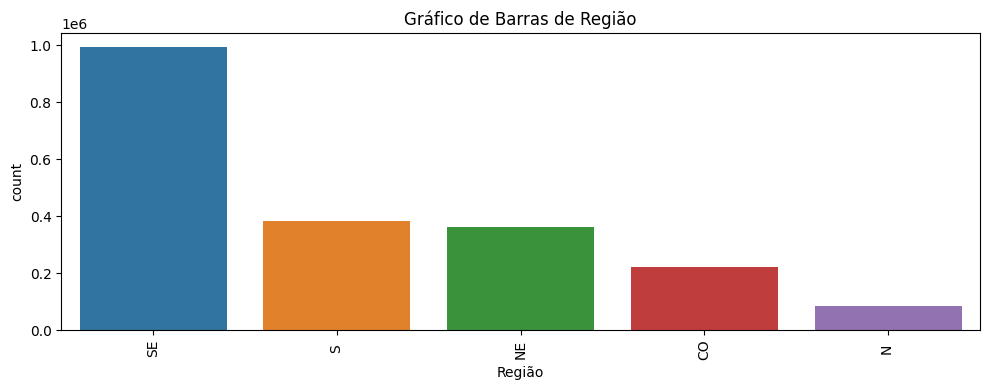

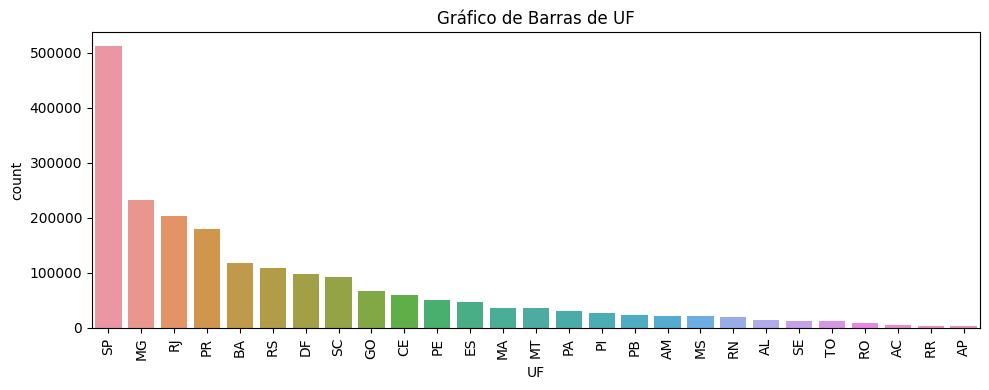

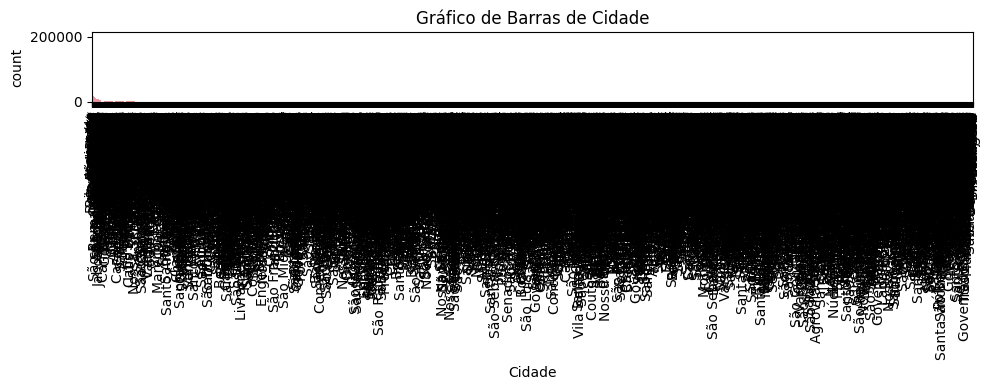

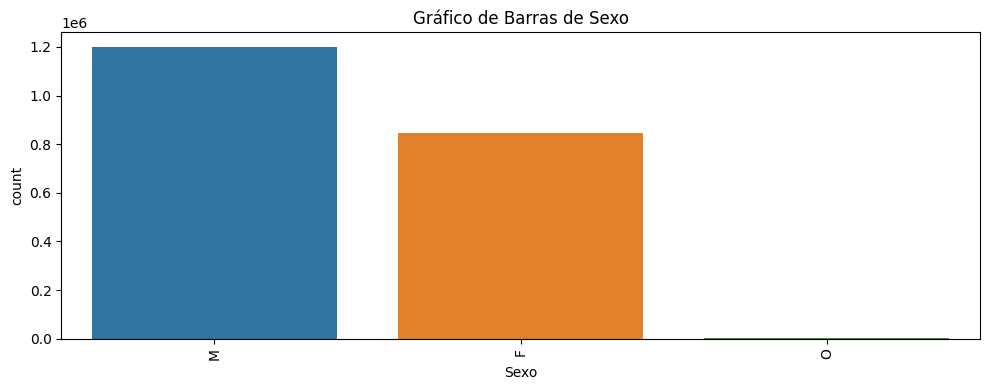

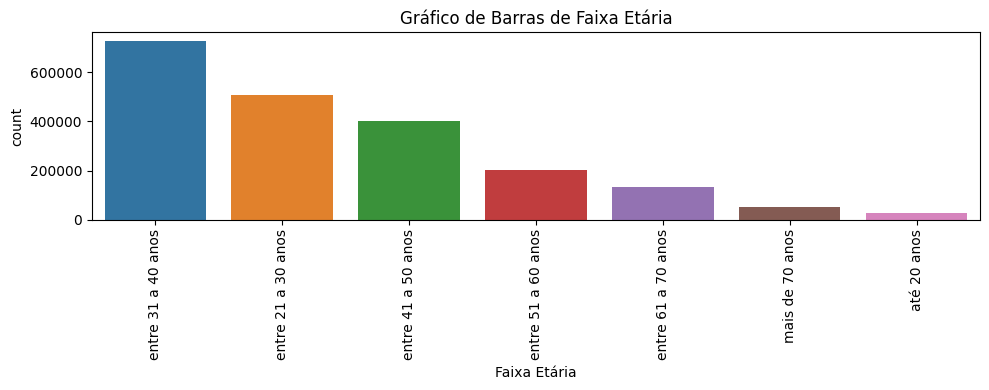

<ipython-input-41-05abbf97968f>:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


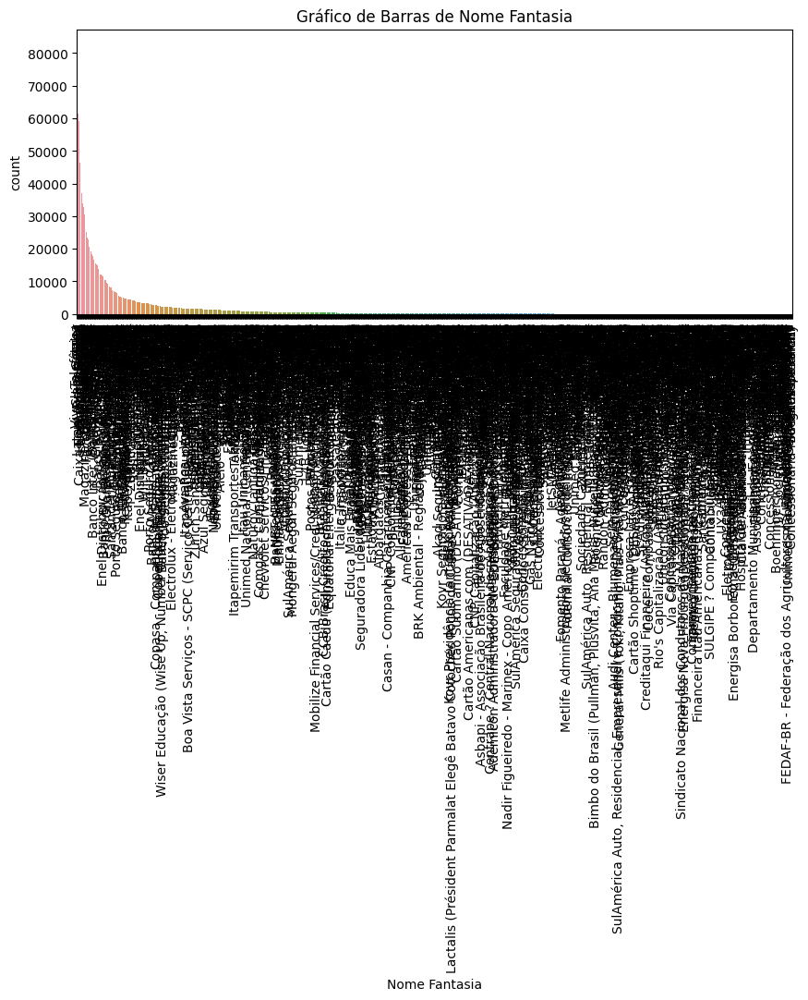

<ipython-input-41-05abbf97968f>:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


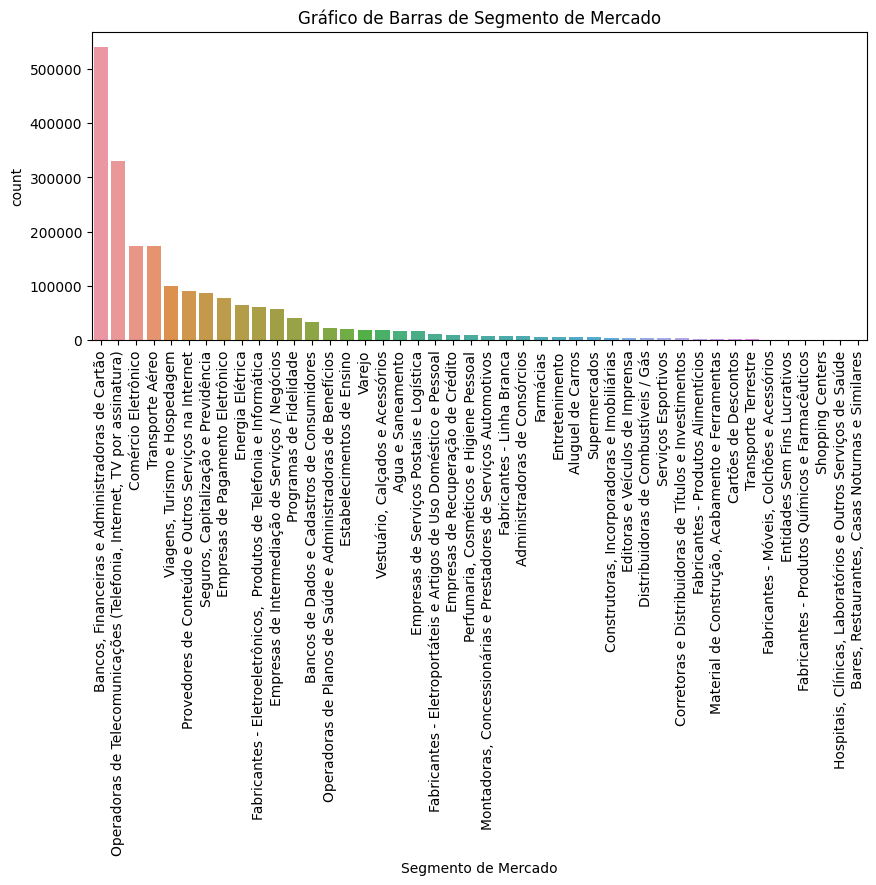

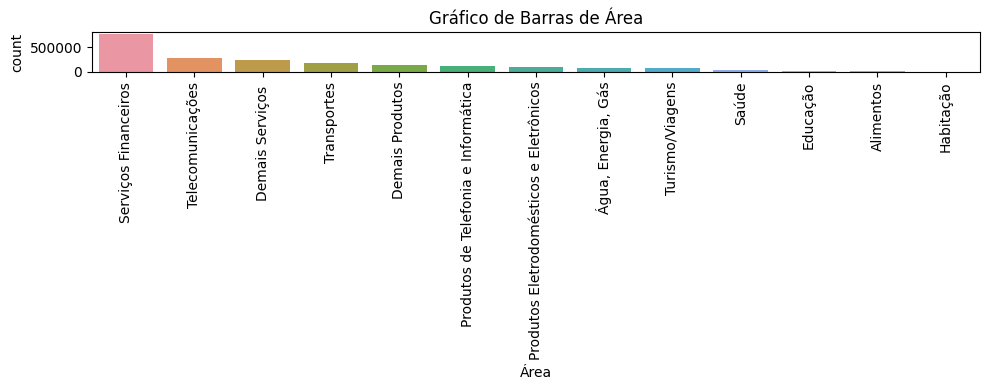

<ipython-input-41-05abbf97968f>:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


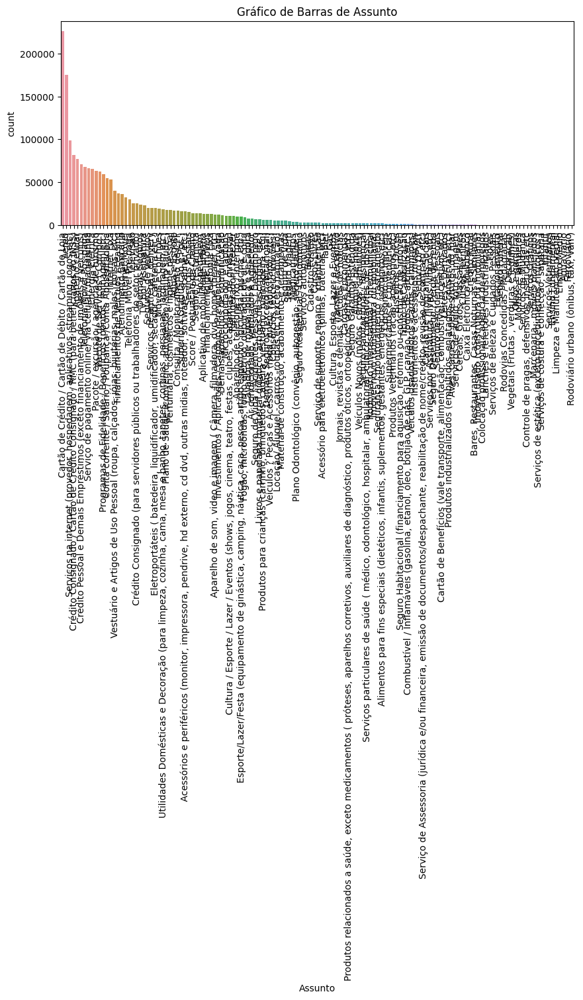

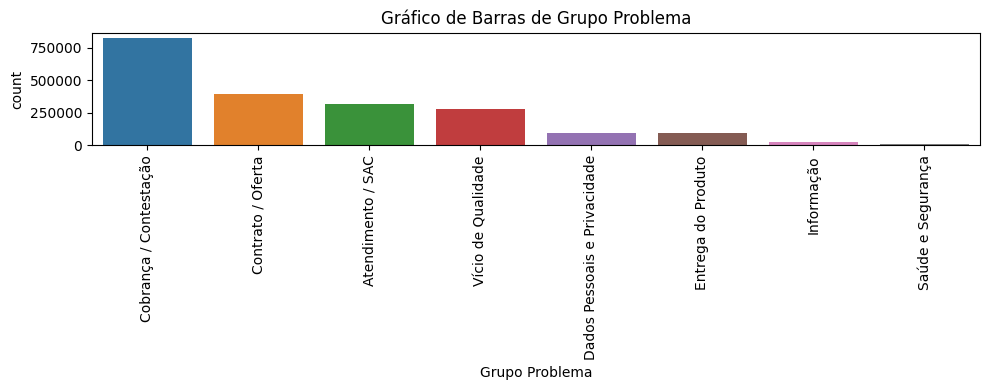

<ipython-input-41-05abbf97968f>:15: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


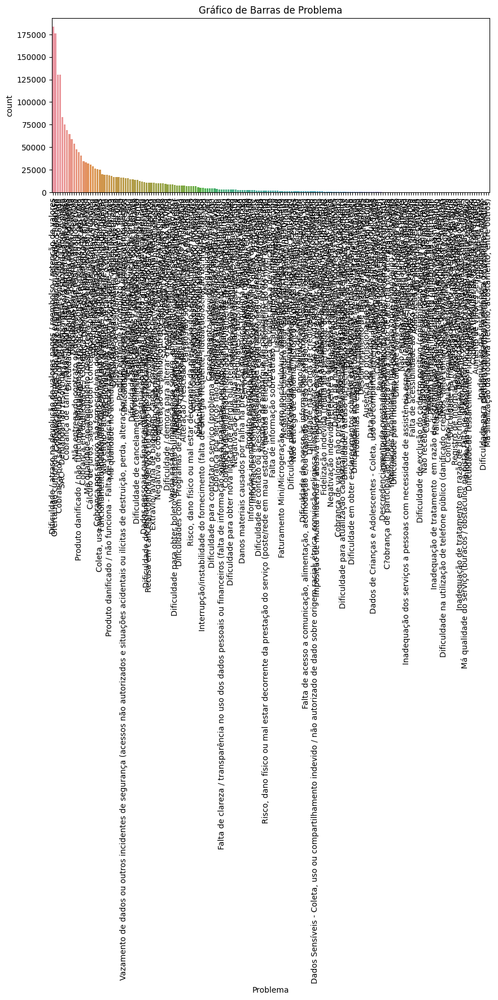

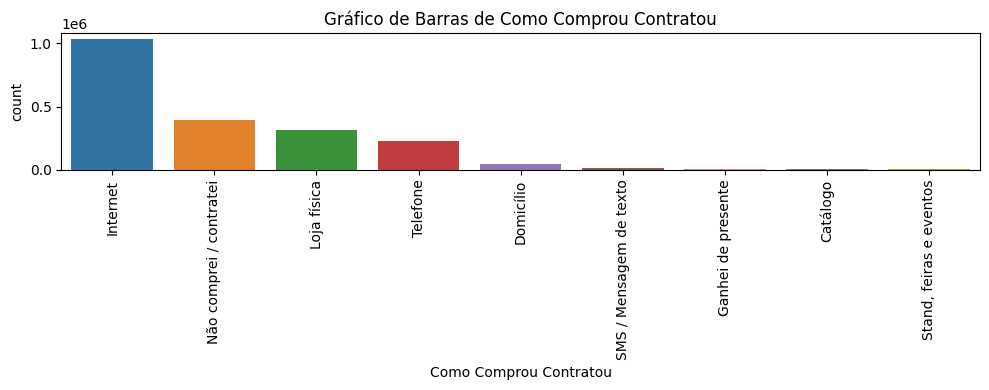

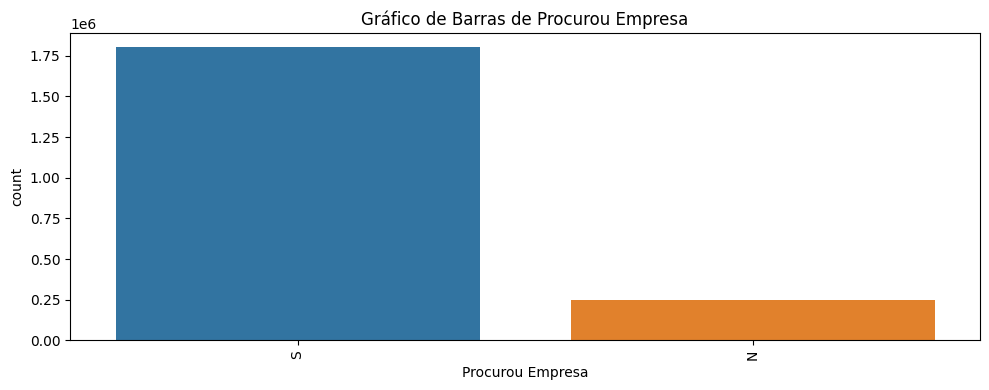

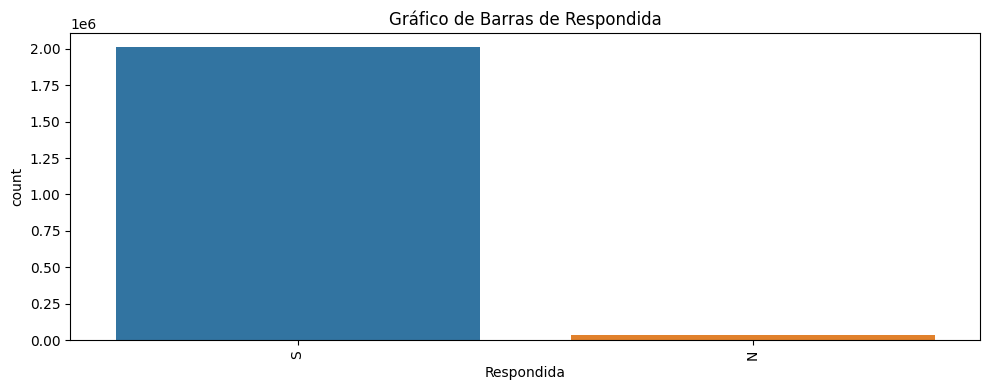

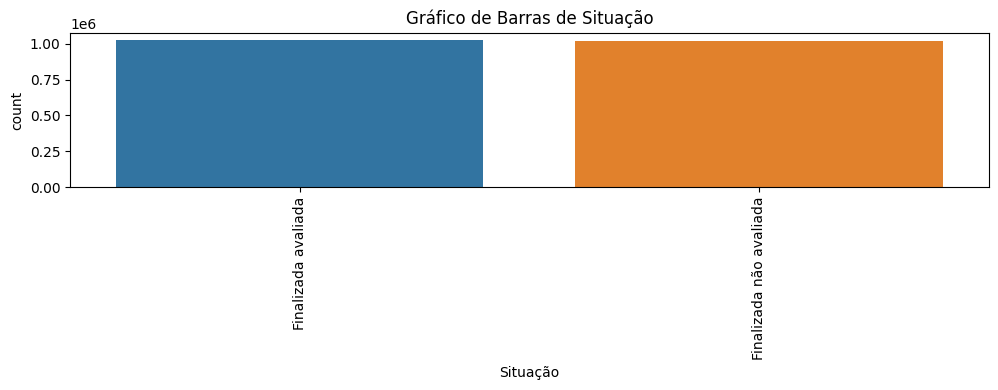

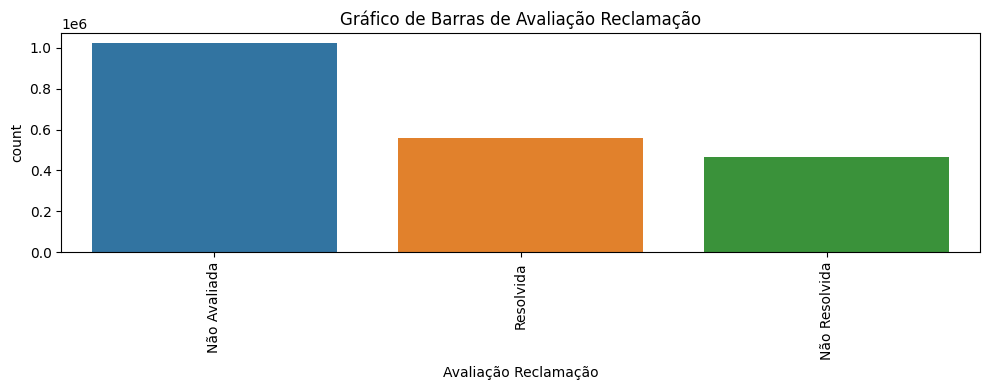

In [41]:
# Lista das colunas categóricas
colunas_categoricas = ['Região', 'UF', 'Cidade', 'Sexo', 'Faixa Etária', 'Nome Fantasia', 'Segmento de Mercado',
                       'Área', 'Assunto', 'Grupo Problema', 'Problema', 'Como Comprou Contratou',
                       'Procurou Empresa', 'Respondida', 'Situação', 'Avaliação Reclamação']

# Loop para criar visualizações unimodais para cada coluna
for coluna in colunas_categoricas:
    plt.figure(figsize=(10, 4))

    # Gráfico de Barras
    sns.countplot(data=final_df, x=coluna, order=final_df[coluna].value_counts().index)
    plt.title(f'Gráfico de Barras de {coluna}')
    plt.xticks(rotation=90)

    plt.tight_layout()
    plt.show()



## **Observações Finais**

## Observações Finais

Este projeto é uma oportunidade para demonstrar as habilidades e conhecimentos que adquiri durante a sprint. Estou ansioso para compartilhar minhas descobertas e aprender com este exercício prático.

Agradeço pela orientação e pelo suporte ao longo deste curso.

Atenciosamente,
Paulo Henrique.